# Coleton, Louis, Barbara Green Team Code
# Applied Machine Learning Final Project

# Importing/Installing Needed Packages

In [1]:
import os
import gc
import datetime
import re

import pandas as pd
pd.options.display.max_rows = 2000
pd.options.display.max_columns = 100

from statistics import mean

import numpy as np

import seaborn as sns
sns.set(font_scale=1.2)
sns.set_style("whitegrid")

import matplotlib.pyplot as plt
from matplotlib import __version__ as plt_version

from functools import reduce

import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import ConfusionMatrixDisplay

from sklearn import naive_bayes #Naive Bayes

from statsmodels.tsa.seasonal import seasonal_decompose

from sklearn.naive_bayes import MultinomialNB

import calendar as cl
from calendar import monthrange

from sklearn import __version__ as sk_version


from sklearn.model_selection import train_test_split #Split data in testing and training

from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.svm import SVR


from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn import metrics

import pydotplus

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split


from six import StringIO
  
from IPython.display import Image  
from sklearn.tree import export_graphviz


import plotly.express as px
from plotly import __version__ as plotly_version

from tqdm import tqdm
from tqdm import __version__ as tqdm_version

# Internal Functions 

In [2]:
#Lag Function
def lag_variable(variable,n_lags):
    """
    Input: Pandas Dataframe
    Output:Same dataframe with their columns lags "n_lags"
    """
    data=pd.DataFrame()
    variables_name=variable.columns.values
    for i in range(1,(n_lags+1)):
        for j in variables_name:
            name=str(j)+'lag_'+ str(i)
            variable[name]=variable[j].shift(i)
    #data = variable.dropna()  # Esto me elimina data vieja que puede ser usada. 
    data = variable
    return data

In [3]:
#Prediction Plot funtion (Scatter plot)
def Prediction_Plots(y_train, y_pred_Train, y_test, y_pred_Test):
    fig, ax = plt.subplots(ncols=2, figsize=(10,4))

    ax[0].scatter(y_train, y_pred_Train)
    ax[0].set_ylim(-1,2.5)
    ax[0].set_xlim(-1,2)
    ax[0].grid()
    ax[0].set_xlabel('y')
    ax[0].set_ylabel('yhat')
    ax[0].set_title('Training Set')

    ax[1].scatter(y_test, y_pred_Test)
    ax[1].set_ylim(-1,2.5)
    ax[1].set_xlim(-1,2)
    ax[1].grid()
    ax[1].set_xlabel('y')
    ax[1].set_ylabel('yhat')
    ax[1].set_title('Testing Set')
    plt.show()
    
    return()

In [4]:
#Metrics (Errors) Printer Function
def Metrics_Printer(y_train, y_pred_Train, y_test, y_pred_Test):
    print('Training Metrics:')
    print('R squared:', metrics.r2_score(y_train, y_pred_Train))
    print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
    print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
    print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

    print('\nTesting Metrics:')
    print('R squared:', metrics.r2_score(y_test, y_pred_Test))
    print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
    print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
    print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))
    
    return()

In [5]:
def Metrics(y_test, y_pred_Test):
    print('Test Metrics:')
    print('R squared:', metrics.r2_score(y_test, y_pred_Test))
    print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
    print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
    print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))
    
    return

In [6]:
#Multiple Runner Fucntion
def Multiple_Runner(model, X, y):
    
    Train_MSE = [] #Empty list to Store MSEs for training data set
    Test_MSE = []  #Empty list to Store MSEs for testing data set

    Train_R2 = [] #Empty list to Store R2s for training data set
    Test_R2 = []  #Empty list to Store R2s for testing data set

    for i in range(1000):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    
        model.fit(X_train, y_train) #Train the model
    
        y_pred_Train  = model.predict(X_train)  #Predictions on training model
        y_pred_Test   = model.predict(X_test)   #Predictions on testing model
    
        train_R2 = metrics.r2_score(y_train, y_pred_Train) #Obtaining the metrics
        test_R2  = metrics.r2_score(y_test, y_pred_Test)
    
        train_MSE = metrics.mean_squared_error(y_train, y_pred_Train)
        test_MSE  = metrics.mean_squared_error(y_test, y_pred_Test)
    
        Train_MSE.append(train_MSE) #Storing the metrics in the lists
        Test_MSE.append(test_MSE) 
    
        Train_R2.append(train_R2) #Storing the metrics in the lists
        Test_R2.append(test_R2)  
    
    print('Train MSE median:', np.median(Train_MSE))
    print('Test MSE median:', np.median(Test_MSE))

    print('\nTrain_R2 median:', np.median(Train_R2))
    print('Test_R2 median:', np.median(Test_R2))

    fig, ax = plt.subplots(ncols=2, figsize=(10,4))

    ax[0].boxplot([Train_MSE, Test_MSE])
    ax[0].set_xticks([1,2],minor = False)                   #setting boxplot names
    ax[0].set_xticklabels(['Train','Test'], minor = False)  #setting boxplot names
    ax[0].grid()
    ax[0].set_title('Mean Squared Error')

    ax[1].boxplot([Train_R2, Test_R2])
    ax[1].set_xticks([1,2],minor = False)
    ax[1].set_xticklabels(['Train','Test'], minor = False)
    ax[1].grid()
    ax[1].set_title('R squared')

    plt.show()

    print('Train MSE standard deviation:', np.std(Train_MSE))
    print('Test MSE standard deviation:', np.std(Test_MSE))

    print('\nTrain_R2 standard deviation:', np.std(Train_R2))
    print('Test_R2 standard deviation:', np.std(Test_R2))

In [7]:
def Multiple_Runs(model,X, y):

    Train_MSE = [] #Empty list to Store MSEs for training data set
    Test_MSE = []  #Empty list to Store MSEs for testing data set

    Train_R2 = [] #Empty list to Store R2s for training data set
    Test_R2 = []  #Empty list to Store R2s for testing data set

    for i in tqdm(range(100)):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
        
        mean = X_train.mean()
        stdev = X_train.std()
        
        X_train_st = (X_train - mean)/stdev 
        X_test_st = (X_test - mean)/stdev 
    
        model.fit(X_train_st, y_train) #Train the model
   
        y_pred_Train  = model.predict(X_train_st)  #Predictions on training model
        y_pred_Test   = model.predict(X_test_st)   #Predictions on testing model
    
        train_R2 = metrics.r2_score(y_train, y_pred_Train) #Obtaining the metrics
        test_R2  = metrics.r2_score(y_test, y_pred_Test)
    
        train_MSE = metrics.mean_squared_error(y_train, y_pred_Train)
        test_MSE  = metrics.mean_squared_error(y_test, y_pred_Test)
    
        Train_MSE.append(train_MSE) #Storing the metrics in the lists
        Test_MSE.append(test_MSE) 
    
        Train_R2.append(train_R2) #Storing the metrics in the lists
        Test_R2.append(test_R2)  
    
    print('Train MSE median:', np.median(Train_MSE))
    print('Test MSE median:', np.median(Test_MSE))

    print('\nTrain_R2 median:', np.median(Train_R2))
    print('Test_R2 median:', np.median(Test_R2))

    fig, ax = plt.subplots(ncols=2, figsize=(10,4))

    ax[0].boxplot([Train_MSE, Test_MSE])
    ax[0].set_xticks([1,2],minor = False)                   #setting boxplot names
    ax[0].set_xticklabels(['Train','Test'], minor = False)  #setting boxplot names
    ax[0].grid()
    ax[0].set_title('Mean Squared Error')

    ax[1].boxplot([Train_R2, Test_R2])
    ax[1].set_xticks([1,2],minor = False)
    ax[1].set_xticklabels(['Train','Test'], minor = False)
    ax[1].grid()
    ax[1].set_title('R squared')

    plt.show()

    print('Train MSE standard deviation:', np.std(Train_MSE))
    print('Test MSE standard deviation: ', np.std(Test_MSE))

    print('\nTrain_R2 standard deviation:', np.std(Train_R2))
    print('Test_R2 standard deviation: ', np.std(Test_R2))

In [8]:
def Model_Performance(model,X,y):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
        
    mean = X_train.mean()
    stdev = X_train.std()
        
    X_train_st = (X_train - mean)/stdev 
    X_test_st = (X_test - mean)/stdev
    
    model.fit(X_train_st,y_train) 

    y_pred_Train = model.predict(X_train_st) #Predictions
    y_pred_Test = model.predict(X_test_st) #Predictions
    
    Metrics(y_test, y_pred_Test)
    
    Predicted_Plot(y_train, y_pred_Train, y_test, y_pred_Test)
    
    Multiple_Runs(model,X, y)
    
    return

In [9]:
def Predicted_Plot(y_train, y_pred_Train, y_test, y_pred_Test):

    fig, ax = plt.subplots(ncols=2, figsize=(10,4))

    ax[0].scatter(y_train, y_pred_Train)
    ax[0].grid()
    ax[0].set_xlabel('Observed Label')
    ax[0].set_ylabel('Predicted Label')
    ax[0].set_title('Training Set')

    ax[1].scatter(y_test, y_pred_Test)
    ax[1].grid()
    ax[1].set_xlabel('Observed Label')
    ax[1].set_ylabel('Predicted Label')
    ax[1].set_title('Testing Set')
    plt.show()
    
    return

# Importing and Cleaning Juan's Data (Including Lagging Data)
### Important to note, not recommended to run the lag for data before visualizing data. 

In [10]:
#Monthly Calendar Dataset
monthly_calendar = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/00_Share_Adelphi/Folder/Calendar/Holidays_colombia_2024.csv")

#Turning it into Datetime
monthly_calendar.index = pd.to_datetime(monthly_calendar['Fecha'])
monthly_calendar.drop("Fecha", axis = 1, inplace = True)
#monthly_calendar.head(12)
#monthly_calendar.info()
#monthly_calendar.isnull().sum()

In [11]:
#MacroEconomic Dataset (Corona)
macro = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/00_Share_Adelphi/Folder/Var_MacroEconomic/Macro_economic_var.csv", encoding='latin-1')

# Renaming the columns - English
macro.columns = ['date', 'Construction_lic_unt','Construction_lic_area', 'Construction_lic_unt_SI','Construction_lic_unt_NO_SI',
            'Construction_lic_area_SI','Construction_lic_area_NO_SI' ,  'Gray_cement_prod', 'Gray_cement_dispatch', 
                 'Gray_cement_dispatch_Factory','Gray_cement_dispatch_comercial','Gray_cement_dispatch_contractor','Gray_cement_dispatch_other',
                 'DTF(interest_rate)','GDP_Constr', 'GDP_Total', 'Inflation', 'USD_exchange', 'Oil_brent', 'Oil_WTI', 'ISE', 'ICC', 'IEC','ICE','Retail_Commerce', 'Unemployment%', 
              'RADAR_Constr', 'RADAR_Rev', 'RADAR_Toilets', 'RADAR_HomeAppliance', 'RADAR_Paint', 'RADAR_Furniture', 'RADAR_Tools', 'RADAR_Elect',
             'RADAR_Plumbing', 'RADAR_Wood', 'RADAR_Supply', 'RADAR_Remodel', "Construction_lic_area/unt", "Construction_lic_area/unt_SI", "Construction_lic_area/unt_NO_SI"]

#Converting to Datetime
macro.index = pd.to_datetime(macro['date'])
macro.drop("date", axis = 1, inplace = True)

#Creating a lag of 12 months forward
macro = lag_variable(macro,12)
#macro.tail()
#macro.info()
#macro.isnull().sum()

In [12]:
#Importing Camacol Dataset
camacol = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/00_Share_Adelphi/Folder/Camacol_Housing/Camacol_Housing.csv", encoding='latin-1', sep=',')

#Renaming the columns - English
camacol.columns = ['date', 'Housing_total_launch', 'Housing_total_launch_SI', 'Housing_total_launch_NO_SI',
                   'Housing_total_initiation','Housing_total_initiation_SI', 'Housing_total_initiation_NO_SI',
                   'Housing_total_sales',  'Housing_total_sales_SI',  'Housing_total_sales_NO_SI', 
                   'Housing_total_offer','Housing_total_Offer_SI', 'Housing_total_Offer_NO_SI']

#Converting to index and Datetime
camacol.index = pd.to_datetime(camacol["date"])
camacol = camacol.drop(columns=['date'])

#Lagging 24 months
camacol = lag_variable(camacol, 24)
#camacol.tail()
#camacol.info()
#camacol.isnull().sum()

In [13]:
#Importing ICCV Dataset
ICCV = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/00_Share_Adelphi/Folder/ICCV/ICCV.csv", encoding='latin-1')
ICCV = ICCV.loc[:, ~ICCV.columns.str.contains('^Unnamed')]

#Making the data Datetime
ICCV["Fecha"] = pd.to_datetime(ICCV["Fecha"],  infer_datetime_format=True, exact = False)

# Renaming the columns - English
ICCV.columns = ['date', 'ICCV_Var_Yearly', 'ICCV_Var_Monthly']
ICCV.set_index("date", inplace = True)

#12 months Lag
ICCV = lag_variable(ICCV,12)
#ICCV.tail()
#ICCV.info()
#ICCV.isnull().sum()

In [14]:
#Importing the Credits Dataset
credit = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/00_Share_Adelphi/Folder/Credits_Superfinanciera/credit_disb.csv", encoding='latin-1', sep=',')

# Renaming the columns - English
credit.columns = ['date', 'Consumer_credit', 'Consumer_microcredit', 'Ordinary_credit', 'Preferencial_credit', 'loan_overdrafts', 'Credit_card', 'Treasury_loan',
                 'Housing_loan']

# Converting to index and data time
credit.index = pd.to_datetime(credit["date"])
credit = credit.drop(columns='date')

#12 months Lag
credit = lag_variable(credit,12)
#credit.tail()
#credit.info()
#credit.isnull().sum()

In [15]:
#Importing Sales Dataset
sales = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/00_Share_Adelphi/Folder/Business/Scaled_sales_porcelana.csv", encoding='latin-1', sep=',')
sales.head(50)

# Renaming the columns - English
sales.columns = ['date', 'Booking', 'Quantity', 'seasonal', 'trend_short_6', 'trend_short_12']

# Converting to index and data time
sales.index = pd.to_datetime(sales["date"])
sales = sales.drop(columns='date')
#sales.tail()
#sales.info()
#sales.isnull().sum()

# Importing Our Own Data

In [16]:
#USA Lodging Spending over the years
lod = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/Project Data/lodging.csv")
lod.index = pd.to_datetime(lod['observation_date'])
lod.drop("observation_date", axis = 1, inplace = True)
#lod.tail()

#Producer Price Index for Home Durable Goods (Products like Vietrous China, Porcelain, etc.)
PPI = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/Project Data/PPI_household_durables.csv")
PPI.index = pd.to_datetime(PPI['observation_date'])
PPI.drop("observation_date", axis = 1, inplace = True)
#PPI.tail()

#Unemployment Data From US
unem = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/Project Data/unemployment_report.csv")
unem.index = pd.to_datetime(unem['DATE'])
unem.drop("DATE", axis = 1, inplace = True)
#unem.tail()

#GDP data
GDP = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/Project Data/GDPC1.csv")
GDP.index = pd.to_datetime(GDP['Date'])
GDP.drop("Date", axis = 1, inplace = True)
#GDP.tail()

#inflation data
inf = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/Project Data/inflation_monthly.csv")
inf.index = pd.to_datetime(inf['DATE'])
inf.drop("DATE", axis = 1, inplace = True)
#inf.tail()

#construction permits
cp = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/Project Data/PERMIT.csv")
cp.index = pd.to_datetime(cp['DATE'])
cp.drop("DATE", axis = 1, inplace = True)
#cp.tail()

#mortgage rates
mor = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/Project Data/MORTGAGE30US.csv")
mor.index = pd.to_datetime(mor['DATE'])
mor.drop("DATE", axis = 1, inplace = True)
#mor.tail()

#population data
pop = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/Project Data/population_growth_rate.csv")
pop.index = pd.to_datetime(pop['Date'])
pop.drop("Date", axis = 1, inplace = True)
#pop.tail()

#EFFR data
EFFR = pd.read_csv("C:/Users/colet/Documents/Adelphi MABA/681 Applied Machine Learning/Project Data/EFFR.csv")
EFFR.index = pd.to_datetime(EFFR['DATE'])
EFFR.drop("DATE", axis = 1, inplace = True)
#EFFR.tail()

# Understanding the DataSets Visually (Not necessary to run)

<AxesSubplot:xlabel='Fecha', ylabel='working_day'>

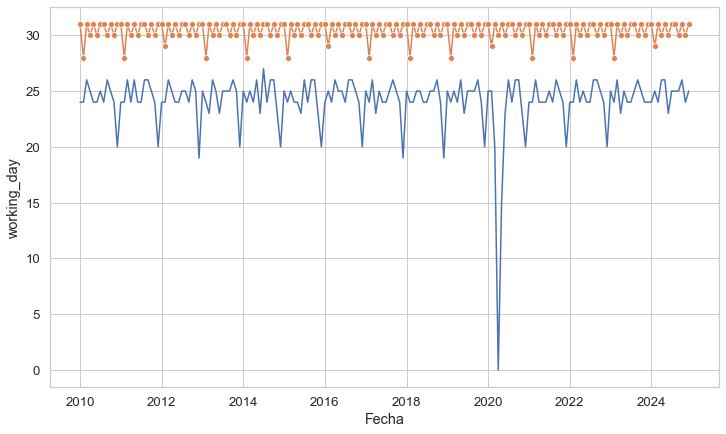

In [197]:
#Monthly Calandar Visuals
plt.figure(figsize=(12,7))
sns.lineplot(x = monthly_calendar.index, y = "working_day", data = monthly_calendar)
sns.lineplot(x = monthly_calendar.index, y = (monthly_calendar["working_day"] + monthly_calendar["sunday"] + monthly_calendar["holiday"]), data = monthly_calendar, marker = "o")

<AxesSubplot:xlabel='Fecha', ylabel='working_day'>

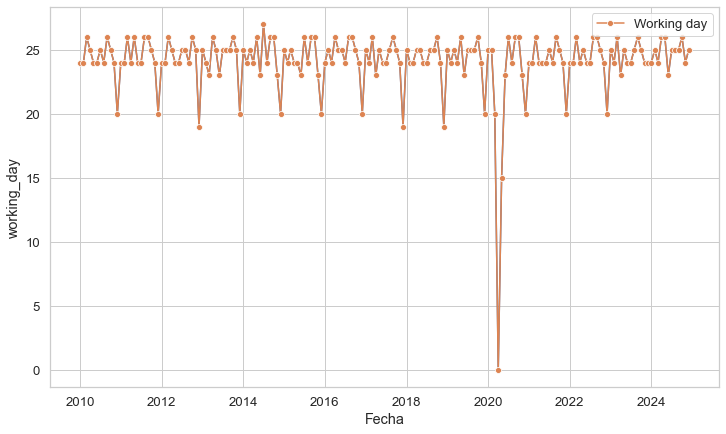

In [198]:
#Monthly Calendar Visuals
plt.figure(figsize=(12,7))
sns.lineplot(x = monthly_calendar.index, y = "working_day", data = monthly_calendar)
sns.lineplot(x = monthly_calendar.index, y = (monthly_calendar["working_day"]), data = monthly_calendar, marker = "o", label = "Working day")

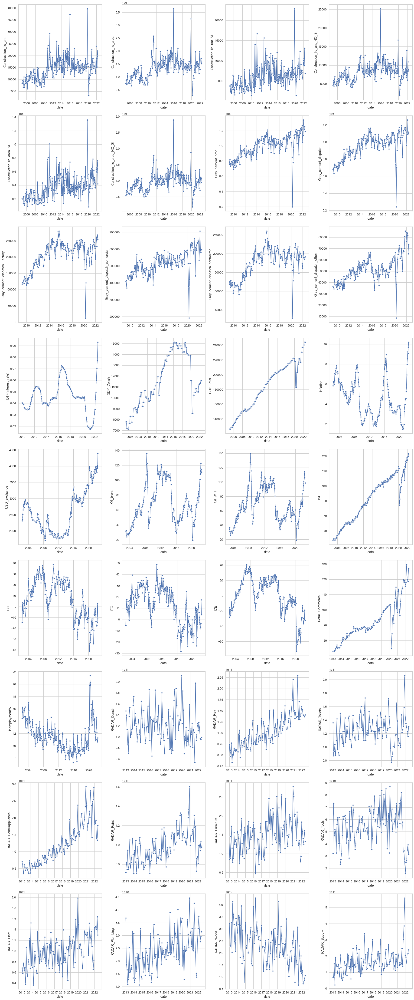

In [199]:
#Macro Data Visuals
fig, axs = plt.subplots(9, 4, figsize=(25,60))
i = 0
j = 0
for key in macro.columns[0:36]:
    if i < 9:
        if j < 4:
            sns.lineplot(x = macro.index, y = key, data = macro, ax=axs[i, j], marker = "o")
            j += 1
        else:
            i +=1 
            j = 0
            sns.lineplot(x = macro.index, y = key, data = macro, ax=axs[i, j], marker = "o")
            j +=1

plt.tight_layout()

plt.show()

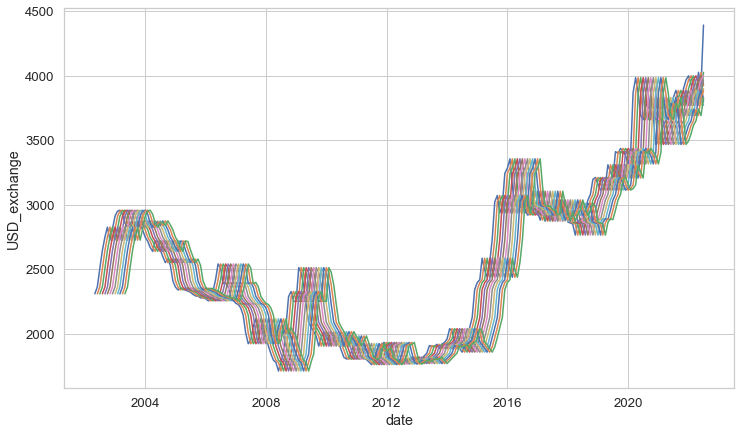

In [200]:
#Macro Data Visuals
plt.figure(figsize=(12,7))
sns.lineplot(x = macro.index, y = "USD_exchange", data = macro)
for i in range(1,13):  
   sns.lineplot(x = macro.index, y = "USD_exchangelag_"+ str(i), data = macro)

IndexError: index 4 is out of bounds for axis 0 with size 4

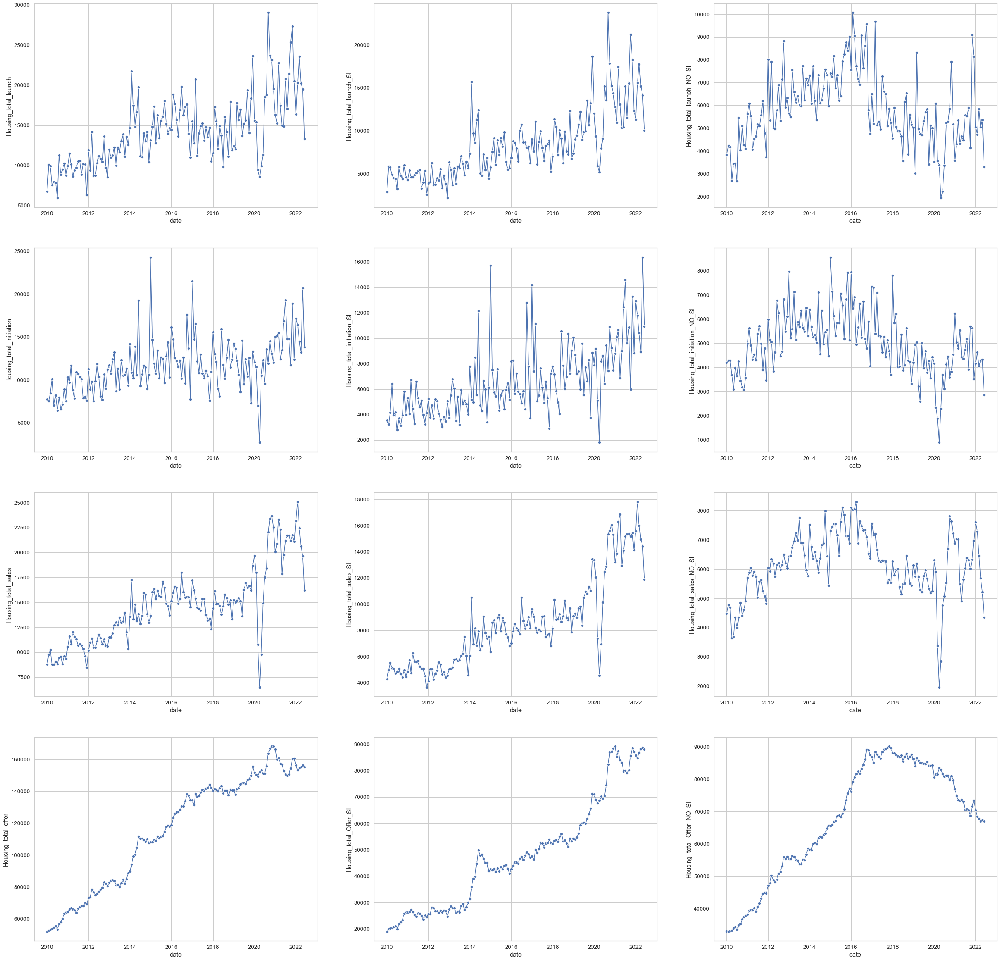

In [202]:
#Camacol Date Visuals
fig, axs = plt.subplots(4, 3, figsize=(40,40))
i = 0
j = 0
for key in camacol.columns:
    if i < 4:
        if j < 3:
            sns.lineplot(x = camacol.index, y = key, data = camacol, ax=axs[i, j], marker = "o")
            j += 1
        else:
            i +=1 
            j = 0
            sns.lineplot(x = camacol.index, y = key, data = camacol, ax=axs[i, j], marker = "o")
            j +=1

plt.tight_layout()

plt.show()

<AxesSubplot:xlabel='date', ylabel='ICCV_Var_Yearly'>

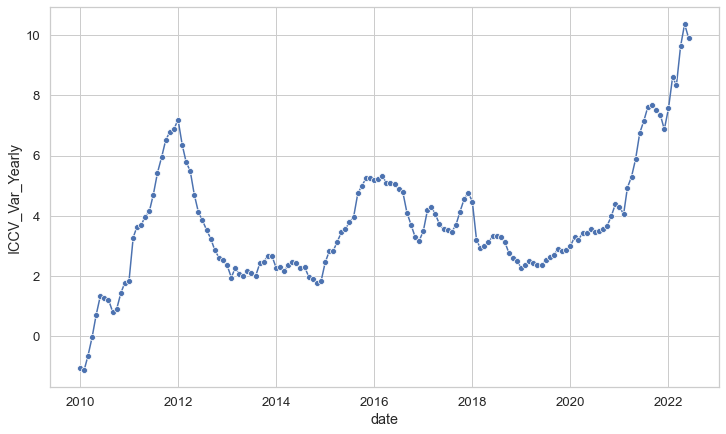

In [204]:
#ICCV Data Visuals
plt.figure(figsize=(12,7))
sns.lineplot(x = ICCV.index, y = 'ICCV_Var_Yearly', data = ICCV,  marker = "o")

<AxesSubplot:xlabel='date', ylabel='ICCV_Var_Monthly'>

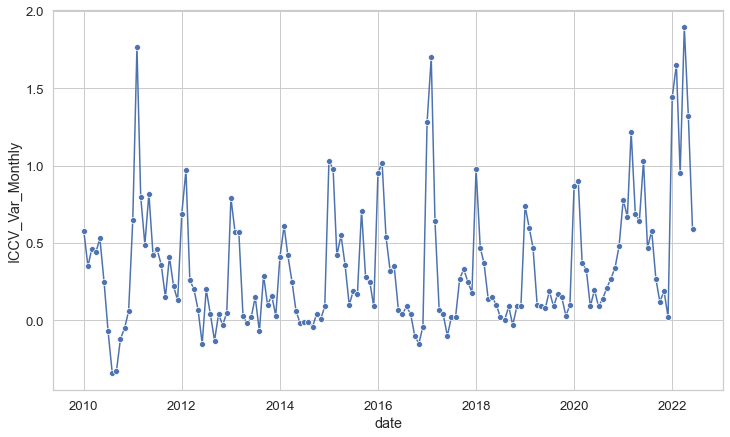

In [205]:
#ICCV Data Visuals
plt.figure(figsize=(12,7))
sns.lineplot(x = ICCV.index, y = 'ICCV_Var_Monthly', data = ICCV,  marker = "o")

IndexError: index 2 is out of bounds for axis 0 with size 2

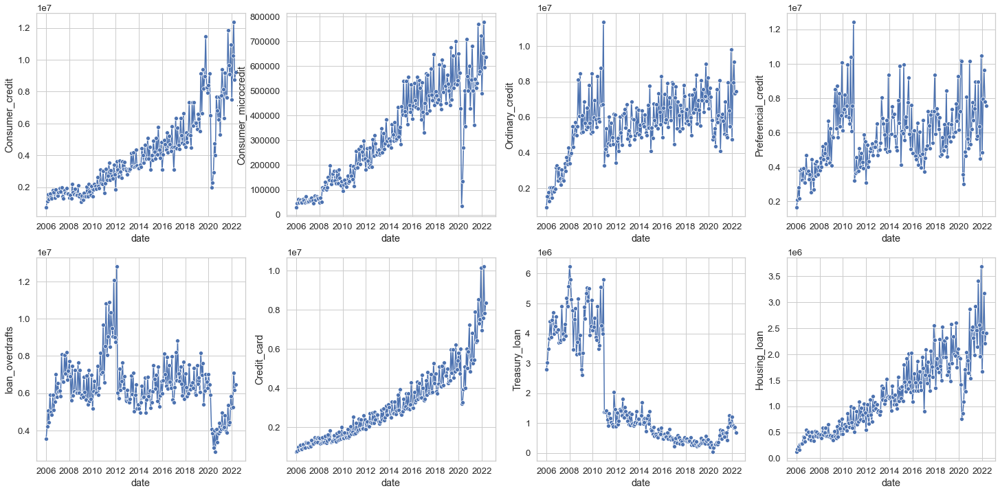

In [206]:
#Credit Data Visuals
fig, axs = plt.subplots(2, 4, figsize=(25,12))
i = 0
j = 0
for key in credit.columns:
    if i < 2:
        if j < 4:
            sns.lineplot(x = credit.index, y = key, data = credit, ax=axs[i, j],  marker = "o")
            j += 1
        else:
            i +=1 
            j = 0
            sns.lineplot(x = credit.index, y = key, data = credit, ax=axs[i, j],  marker = "o")
            j +=1

plt.tight_layout()
plt.show()

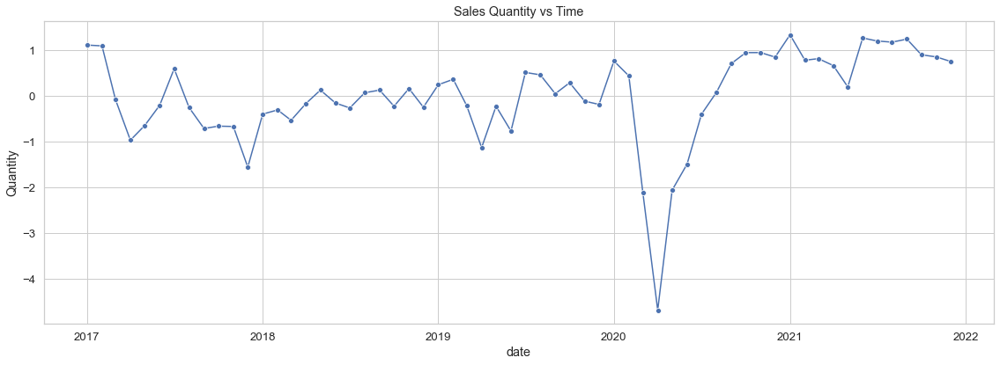

In [207]:
#Sales Data Visuals
plt.figure(figsize=(16,6))

sns.lineplot(x = sales.index, y = "Quantity", data = sales, marker = "o")

plt.title("Sales Quantity vs Time")

plt.tight_layout()
plt.show()

# Merging our Data (Not with Juan's)

In [17]:
#Merging our Chosen Datasets
total_chosen = reduce(lambda left,right: pd.merge(left,right,left_index=True, right_index=True, how='left'),
                 [lod,PPI,unem,inf,GDP,cp,mor,pop,EFFR])
#Dropping Random NA variables
total_chosen = total_chosen.drop(columns='Unnamed: 2')
total_chosen = total_chosen.drop(columns='Unnamed: 3')

#Renaming our Variables
total_chosen.columns = ['Lodging', 'Price Index', 'Unemployment Rate', 'Inflation', 'GDP', 'Construction Permit', 'Mortgage Rate', 'Population Rate', 'EFFR']

#total_chosen

In [18]:
#Observing Null Variables in our Data
#nullseries_chosen = total_chosen.isnull().sum()
#print(nullseries_chosen[nullseries_chosen > 0])

#Dropping all NA in our Data
total_chosen = total_chosen.dropna()
#print(total_chosen.isnull().sum())
total_chosen.head(7)

,Lodging,Price Index,Unemployment Rate,Inflation,GDP,Construction Permit,Mortgage Rate,Population Rate,EFFR
observation_date,,,,,,,,,
2017-10-01,28600,251.7,4.2,2.0,18310.300,1350.0,3.8950,0.0060,1.155714
2017-11-01,28483,251.7,4.2,2.2,18310.300,1290.0,3.9220,0.0059,1.155714
2017-12-01,29615,251.7,4.1,2.1,18310.300,1304.0,3.9500,0.0058,1.298500
2018-01-01,29737,253.3,4.0,2.1,18437.127,1314.0,4.0325,0.0057,1.416190
2018-02-01,30454,261.2,4.1,2.2,18437.127,1342.0,4.3300,0.0056,1.416316
2018-03-01,29940,264.5,4.0,2.4,18437.127,1402.0,4.4440,0.0055,1.505455
2018-04-01,31498,264.6,4.0,2.5,18565.697,1388.0,4.4675,0.0055,1.692381


# Visualizing our Data (Not Necessary to Run)

<AxesSubplot:>

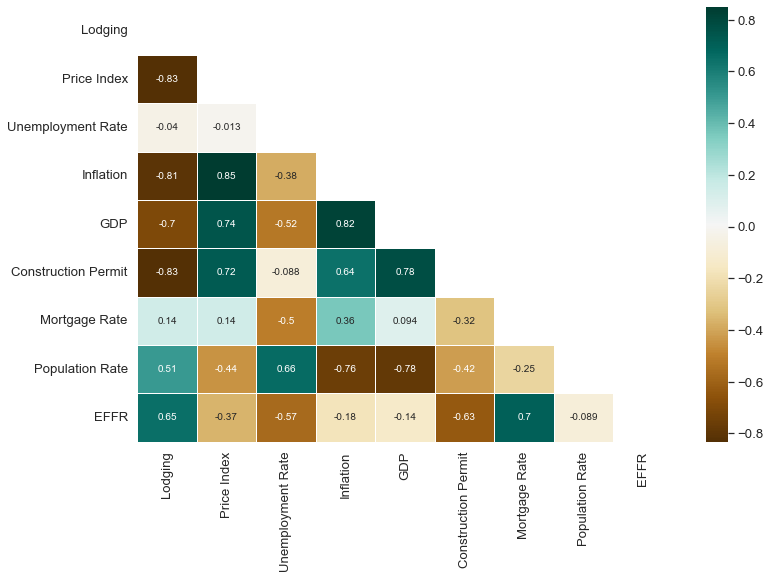

In [209]:
#Looking at a heatmap of our variables
plt.figure(figsize=(12,8))
mask1 = np.triu(np.ones_like(total_chosen.corr(), dtype=np.bool))
sns.heatmap(data = total_chosen.corr(), annot= True, linewidths=.5, cmap='BrBG', mask=mask1,  annot_kws={"fontsize":10})

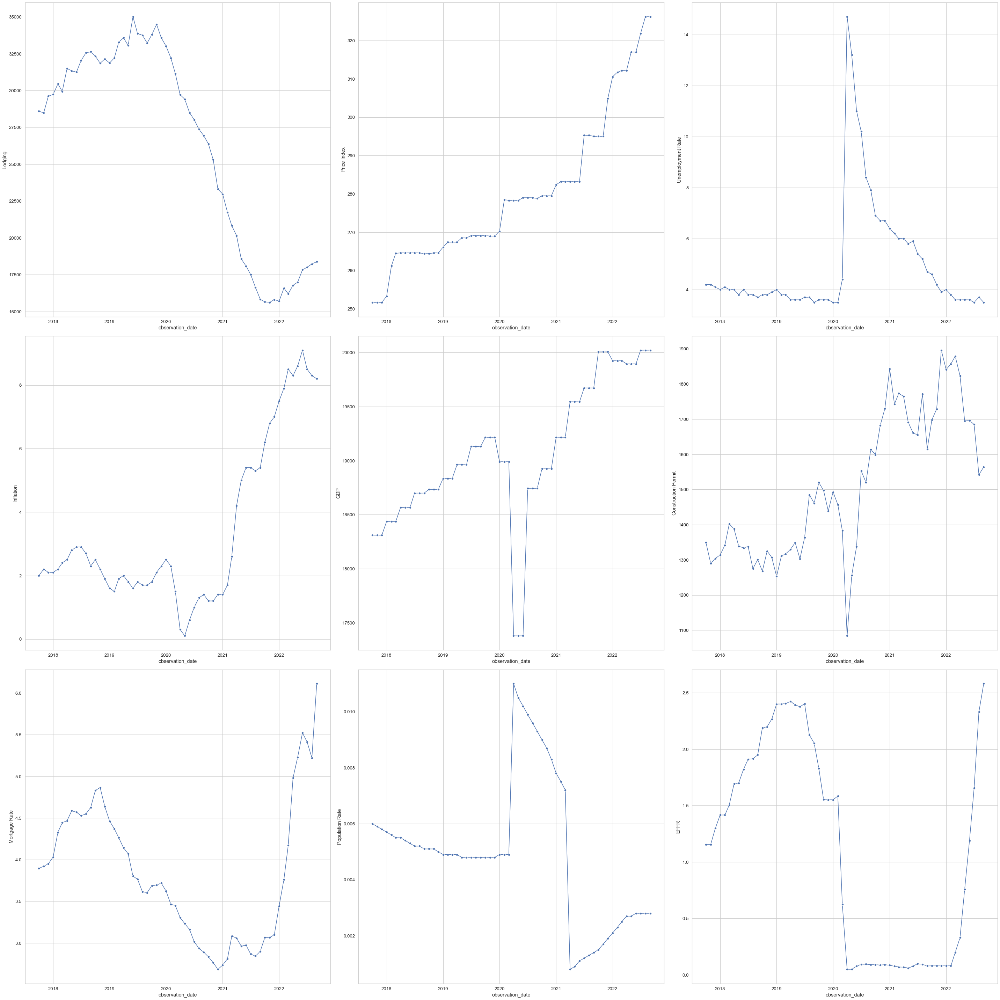

In [208]:
#Visualizing our Data
fig, axs = plt.subplots(3, 3, figsize=(40,40))
i = 0
j = 0
for key in total_chosen.columns:
    if i < 4:
        if j < 3:
            sns.lineplot(x = total_chosen.index, y = key, data = total_chosen, ax=axs[i, j], marker = "o")
            j += 1
        else:
            i +=1 
            j = 0
            sns.lineplot(x = total_chosen.index, y = key, data = total_chosen, ax=axs[i, j], marker = "o")
            j +=1

plt.tight_layout()

plt.show()

# Merging all Datasets

In [19]:
#Merging Just Juan's Data
total_juan = reduce(lambda left,right: pd.merge(left,right,left_index=True, right_index=True, how='left'),
                 [sales, macro, camacol, ICCV, credit, monthly_calendar])
#Dropping Random Unneeded Variables
total_juan = total_juan.drop(columns='trend_short_6')
total_juan = total_juan.drop(columns='trend_short_12')
total_juan = total_juan.dropna()

In [20]:
#Merging Juan's Data with Our Data
total = reduce(lambda left,right: pd.merge(left,right,left_index=True, right_index=True, how='left'),
                 [sales, macro, camacol, ICCV, credit, monthly_calendar, lod, PPI, GDP, unem, inf, cp, mor, pop, EFFR])

In [21]:
#Converting the new dataset with all data into Datetime
total = total[total.index < pd.to_datetime('2021-07-01')]

#Dropping Random NA variables
total = total.drop(columns='Unnamed: 2')
total = total.drop(columns='Unnamed: 3')

total = total.dropna()
#print(total.isnull().sum())

#total.head()

# Correlation Analysis

In [22]:
#This finds the correlation of all features in total(df) to Quantity(of Sales)
corr = total_juan.corr()['Quantity'].sort_values(ascending=False)
#print(corr[corr >= 0.4])
#print(corr[corr <= -0.3])
#print(len(corr))
#print(total.columns)
#print(total.shape)
#print(corr)

In [23]:
#Now we are setting Total Juan to be equal to X for later use in Training/Testing Models
X = total_juan # Features
X.head()

,Booking,Quantity,seasonal,Construction_lic_unt,Construction_lic_area,Construction_lic_unt_SI,Construction_lic_unt_NO_SI,Construction_lic_area_SI,Construction_lic_area_NO_SI,Gray_cement_prod,Gray_cement_dispatch,Gray_cement_dispatch_Factory,Gray_cement_dispatch_comercial,Gray_cement_dispatch_contractor,Gray_cement_dispatch_other,DTF(interest_rate),GDP_Constr,GDP_Total,Inflation,USD_exchange,Oil_brent,Oil_WTI,ISE,ICC,IEC,ICE,Retail_Commerce,Unemployment%,RADAR_Constr,RADAR_Rev,RADAR_Toilets,RADAR_HomeAppliance,RADAR_Paint,RADAR_Furniture,RADAR_Tools,RADAR_Elect,RADAR_Plumbing,RADAR_Wood,RADAR_Supply,RADAR_Remodel,Construction_lic_area/unt,Construction_lic_area/unt_SI,Construction_lic_area/unt_NO_SI,Construction_lic_untlag_1,Construction_lic_arealag_1,Construction_lic_unt_SIlag_1,Construction_lic_unt_NO_SIlag_1,Construction_lic_area_SIlag_1,Construction_lic_area_NO_SIlag_1,Gray_cement_prodlag_1,...,Consumer_microcreditlag_7,Ordinary_creditlag_7,Preferencial_creditlag_7,loan_overdraftslag_7,Credit_cardlag_7,Treasury_loanlag_7,Housing_loanlag_7,Consumer_creditlag_8,Consumer_microcreditlag_8,Ordinary_creditlag_8,Preferencial_creditlag_8,loan_overdraftslag_8,Credit_cardlag_8,Treasury_loanlag_8,Housing_loanlag_8,Consumer_creditlag_9,Consumer_microcreditlag_9,Ordinary_creditlag_9,Preferencial_creditlag_9,loan_overdraftslag_9,Credit_cardlag_9,Treasury_loanlag_9,Housing_loanlag_9,Consumer_creditlag_10,Consumer_microcreditlag_10,Ordinary_creditlag_10,Preferencial_creditlag_10,loan_overdraftslag_10,Credit_cardlag_10,Treasury_loanlag_10,Housing_loanlag_10,Consumer_creditlag_11,Consumer_microcreditlag_11,Ordinary_creditlag_11,Preferencial_creditlag_11,loan_overdraftslag_11,Credit_cardlag_11,Treasury_loanlag_11,Housing_loanlag_11,Consumer_creditlag_12,Consumer_microcreditlag_12,Ordinary_creditlag_12,Preferencial_creditlag_12,loan_overdraftslag_12,Credit_cardlag_12,Treasury_loanlag_12,Housing_loanlag_12,holiday,sunday,working_day
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-01-01,0.780650,1.115820,0.609917,11303.0,1185131.0,3587.0,7716.0,229478.0,955653.0,897063.518,9.131904e+05,194276.0200,502084.8330,171559.9665,45269.5875,0.0694,14531.033059,206658.743109,5.47,2944.65,52.19,52.81,102.568749,-30.2,-28.3,-33.1,88.253255,11.733267,1.044525e+11,1.323489e+11,1.727682e+11,1.050914e+11,8.847567e+10,8.354725e+10,5.008444e+10,9.372000e+10,3.037115e+10,3.136015e+10,1.585430e+11,1.050763e+12,104.851013,63.974909,123.853421,22918.0,2112567.0,9992.0,12926.0,599908.0,1512659.0,1098666.173,...,555441.9044,7916686.911,6566090.070,7930536.312,4347164.930,677598.1836,1864166.572,4353892.017,433679.7772,5854575.608,4445890.861,6402426.269,3390803.016,550883.0739,1302564.560,4680431.000,460632.0000,5702443.000,4657354.000,7012296.000,3283417.000,549789.0000,1454672.000,4941981.754,531850.1926,7315235.649,6120086.089,8140200.383,3814229.013,632387.5921,1627959.289,4068020.900,438682.2679,6513619.182,6137144.374,6675101.294,2989980.729,483448.3473,1298811.962,3106784.500,386289.5525,4875376.339,4791146.877,5996088.922,3013612.505,470541.3290,1093819.181,1,5,25
2017-02-01,0.140791,1.098511,1.462032,16187.0,1590979.0,4659.0,11528.0,272961.0,1318018.0,1025704.960,1.007968e+06,228359.8390,530826.1625,199731.6950,49050.6025,0.0678,14531.033059,206658.743109,5.18,2881.68,53.40,54.01,103.000526,-24.3,-19.9,-31.0,85.336928,10.504292,1.574855e+11,8.351517e+10,1.096908e+11,8.252536e+10,8.582517e+10,1.522091e+11,5.056706e+10,6.034851e+10,2.138243e+10,2.216364e+10,2.104634e+11,1.036176e+12,98.287453,58.587894,114.331888,11303.0,1185131.0,3587.0,7716.0,229478.0,955653.0,897063.518,...,427158.3795,5430545.717,4119152.514,6258157.459,3447128.397,478975.7922,1302860.802,5430241.566,555441.9044,7916686.911,6566090.070,7930536.312,4347164.930,677598.1836,1864166.572,4353892.017,433679.7772,5854575.608,4445890.861,6402426.269,3390803.016,550883.0739,1302564.560,4680431.000,460632.0000,5702443.000,4657354.000,701229

In [24]:
#Setting y to just Quantity for later use in training/testing models
y = total_juan.iloc[:,1] # Labels
y.head()

date
2017-01-01    1.115820
2017-02-01    1.098511
2017-03-01   -0.073592
2017-04-01   -0.962691
2017-05-01   -0.638951
Name: Quantity, dtype: float64

### Doing a train/test split for lasso regression
##### Purpose is to find intercorrelation and remove unneccesary features

In [25]:
#Training and Running a Lasso Regression to drop Variables which show intercorrelation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

LassoReg = Lasso(alpha = 0.1)  #Default value for alpha = 1
LassoReg.fit(X_train, y_train)

y_pred_Train = LassoReg.predict(X_train) #Predictions on training model
y_pred_Test  = LassoReg.predict(X_test)  #Predictions on testing model

LasRegInt = abs(LassoReg.coef_)

print('Intercept:',LassoReg.intercept_)
print('Coefficients:', LassoReg.coef_)

Intercept: -3.2048572703726763
Coefficients: [ 0.00000000e+00  0.00000000e+00 -0.00000000e+00  6.96353334e-05
  1.66468082e-07 -2.44373299e-06 -0.00000000e+00  8.96907061e-09
  2.36889511e-08  3.88953510e-06  4.68890838e-07 -1.60558022e-06
  8.35379098e-07 -3.39632880e-10  2.88440873e-06 -0.00000000e+00
 -3.18966660e-05  1.21893340e-06 -0.00000000e+00  0.00000000e+00
 -0.00000000e+00 -0.00000000e+00  0.00000000e+00 -0.00000000e+00
  0.00000000e+00 -0.00000000e+00  0.00000000e+00  0.00000000e+00
 -4.07391131e-12  6.33906591e-13 -2.72000342e-12 -1.80054399e-12
 -8.21307351e-12  1.93352421e-12  5.08663236e-12 -4.89645305e-13
  1.47415450e-11  4.21936187e-11 -1.36440740e-12 -2.11509355e-13
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00  1.47125660e-05
  3.16730217e-08  3.94842431e-07  0.00000000e+00  2.17891522e-07
 -1.82097001e-07  8.63744770e-07 -5.56957592e-07 -3.42735792e-06
  2.23683042e-06 -9.88510083e-06  5.87778884e-06 -0.00000000e+00
 -7.03327568e-06  1.01622320e-05 -0.00000000e

In [26]:
#Creating a new dataframe which contains the variables kept from the lasso regression
select_var = []

for i in range(len(total_juan.columns.to_list())):
        if LasRegInt[i] > 0:
            select_var.append(total_juan.columns.to_list()[i])
print(len(select_var))

415


In [27]:
#Rennaming the new dataframe
new_total = total_juan[select_var]
new_total.head()

,Construction_lic_unt,Construction_lic_area,Construction_lic_unt_SI,Construction_lic_area_SI,Construction_lic_area_NO_SI,Gray_cement_prod,Gray_cement_dispatch,Gray_cement_dispatch_Factory,Gray_cement_dispatch_comercial,Gray_cement_dispatch_contractor,Gray_cement_dispatch_other,GDP_Constr,GDP_Total,RADAR_Constr,RADAR_Rev,RADAR_Toilets,RADAR_HomeAppliance,RADAR_Paint,RADAR_Furniture,RADAR_Tools,RADAR_Elect,RADAR_Plumbing,RADAR_Wood,RADAR_Supply,RADAR_Remodel,Construction_lic_untlag_1,Construction_lic_arealag_1,Construction_lic_unt_SIlag_1,Construction_lic_area_SIlag_1,Construction_lic_area_NO_SIlag_1,Gray_cement_prodlag_1,Gray_cement_dispatchlag_1,Gray_cement_dispatch_Factorylag_1,Gray_cement_dispatch_comerciallag_1,Gray_cement_dispatch_contractorlag_1,Gray_cement_dispatch_otherlag_1,GDP_Constrlag_1,GDP_Totallag_1,RADAR_Constrlag_1,RADAR_Revlag_1,RADAR_Toiletslag_1,RADAR_HomeAppliancelag_1,RADAR_Paintlag_1,RADAR_Furniturelag_1,RADAR_Toolslag_1,RADAR_Electlag_1,RADAR_Plumbinglag_1,RADAR_Woodlag_1,RADAR_Supplylag_1,RADAR_Remodellag_1,...,Treasury_loanlag_6,Housing_loanlag_6,Consumer_creditlag_7,Consumer_microcreditlag_7,Ordinary_creditlag_7,Preferencial_creditlag_7,loan_overdraftslag_7,Credit_cardlag_7,Treasury_loanlag_7,Housing_loanlag_7,Consumer_creditlag_8,Consumer_microcreditlag_8,Ordinary_creditlag_8,Preferencial_creditlag_8,loan_overdraftslag_8,Credit_cardlag_8,Treasury_loanlag_8,Housing_loanlag_8,Consumer_creditlag_9,Consumer_microcreditlag_9,Ordinary_creditlag_9,Preferencial_creditlag_9,loan_overdraftslag_9,Credit_cardlag_9,Treasury_loanlag_9,Housing_loanlag_9,Consumer_creditlag_10,Consumer_microcreditlag_10,Ordinary_creditlag_10,Preferencial_creditlag_10,loan_overdraftslag_10,Credit_cardlag_10,Treasury_loanlag_10,Housing_loanlag_10,Consumer_creditlag_11,Consumer_microcreditlag_11,Ordinary_creditlag_11,Preferencial_creditlag_11,loan_overdraftslag_11,Credit_cardlag_11,Treasury_loanlag_11,Housing_loanlag_11,Consumer_creditlag_12,Consumer_microcreditlag_12,Ordinary_creditlag_12,Preferencial_creditlag_12,loan_overdraftslag_12,Credit_cardlag_12,Treasury_loanlag_12,Housing_loanlag_12
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-01-01,11303.0,1185131.0,3587.0,229478.0,955653.0,897063.518,9.131904e+05,194276.0200,502084.8330,171559.9665,45269.5875,14531.033059,206658.743109,1.044525e+11,1.323489e+11,1.727682e+11,1.050914e+11,8.847567e+10,8.354725e+10,5.008444e+10,9.372000e+10,3.037115e+10,3.136015e+10,1.585430e+11,1.050763e+12,22918.0,2112567.0,9992.0,599908.0,1512659.0,1098666.173,1.006879e+06,216560.1825,572790.6535,174998.6720,42529.0985,14832.079903,207206.982510,1.371469e+11,9.050789e+10,1.548505e+11,1.189532e+11,8.731673e+10,1.791737e+11,5.703781e+10,9.434221e+10,1.375088e+10,2.516318e+10,3.386863e+11,1.296929e+12,...,478975.7922,1302860.802,5430241.566,555441.9044,7916686.911,6566090.070,7930536.312,4347164.930,677598.1836,1864166.572,4353892.017,433679.7772,5854575.608,4445890.861,6402426.269,3390803.016,550883.0739,1302564.560,4680431.000,460632.0000,5702443.000,4657354.000,7012296.000,3283417.000,549789.0000,1454672.000,4941981.754,531850.1926,7315235.649,6120086.089,8140200.383,3814229.013,632387.5921,1627959.289,4068020.900,438682.2679,6513619.182,6137144.374,6675101.294,2989980.729,483448.3473,1298811.962,3106784.500,386289.5525,4875376.339,4791146.877,5996088.922,3013612.505,470541.3290,1093819.181
2017-02-01,16187.0,1590979.0,4659.0,272961.0,1318018.0,1025704.960,1.007968e+06,228359.8390,530826.1625,199731.6950,49050.6025,14531.033059,206658.743109,1.574855e+11,8.351517e+10,1.096908e+11,8.252536e+10,8.582517e+10,1.522091e+11,5.056706e+10,6.034851e+10,2.138243e+10,2.216364e+10,2.104634e+11,1.036176e+12,11303.0,1185131.0,3587.0,229478.0,955653.0,897063.518,9.131904e+05,194276.0200,502084.8330,171559.9665,45269.5875,14531.033059,206658.743109,1.044525e+11,1.323489e+11,1.727682e+11,1.050914e+11,8.847567e+10,8.354725e+10,5.008444e+10,9.372000e+10,3.037115e

##### Now we are finding the correlations of these kept features with quantity of sales

In [28]:
#Creating corr2 is the correlation of features of dataset after lasso with quantity of sales
corr2 = new_total.corrwith(sales.Quantity).sort_values(ascending=False)

#Breaking these features into two categories; upper and lower cor
upper_cor = corr2[corr2 >= 0.4]
lower_cor = corr2[corr2 <= -0.3]
#print(len(upper_cor))
#print(len(lower_cor))

In [29]:
#Creating a new dataframe with the upper correlation features, the threshold we have for this dataframe is .4 or higher
new_total_upper = []

for i in range(len(new_total.columns.to_list())):
    if new_total.corrwith(sales.Quantity)[i] >= 0.4:
        new_total_upper.append(new_total.columns.to_list()[i])
print(len(new_total_upper))

23


In [30]:
#Creating a new dataframe with the lower correlation features, the threshold we have for this dataframe is -.3 or lower

new_total_lower = []

for i in range(len(new_total.columns.to_list())):
    if new_total.corrwith(sales.Quantity)[i] <= -0.3:
        new_total_lower.append(new_total.columns.to_list()[i])
print(len(new_total_lower))

29


In [31]:
#Renaming the newly made upper correlation dataset
final_var_upper = new_total[new_total_upper]
#final_var_upper

#Renaming the newly made lower correlation dataset
final_var_lower = new_total[new_total_lower]
#final_var_lower

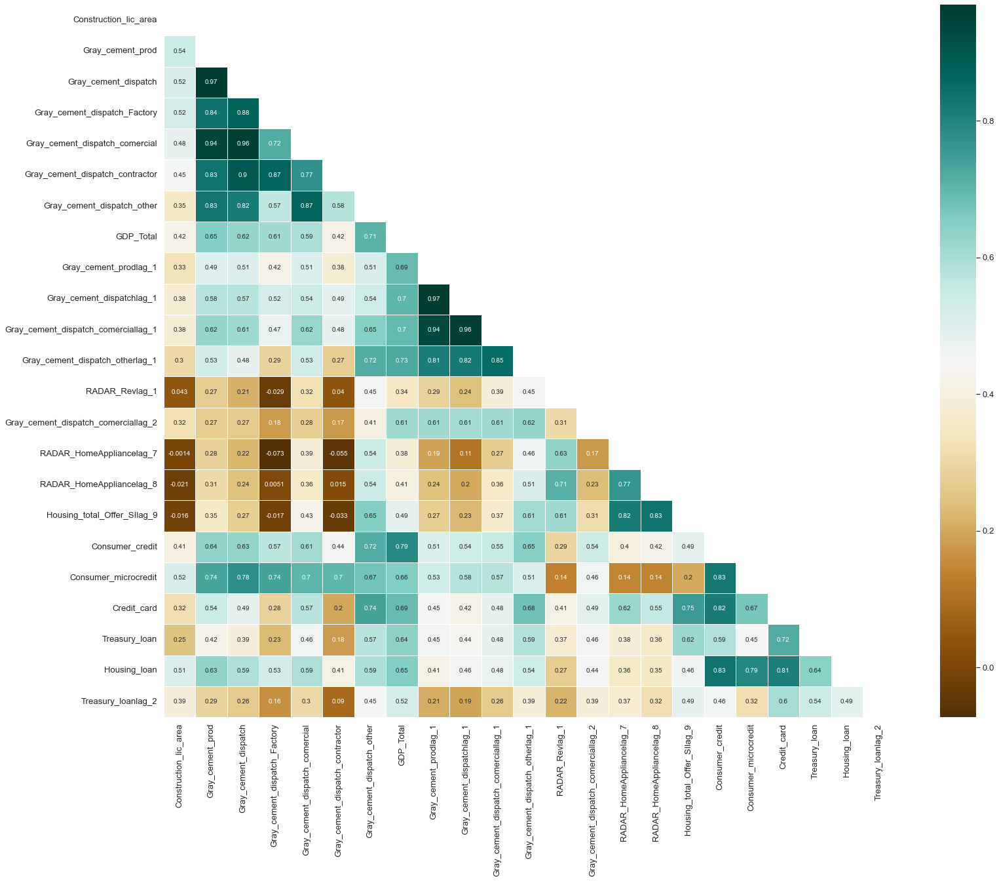

In [32]:
#Creating a data visualization of this new upper correlation dataset (not necessary to run)
plt.figure(figsize=(25,20))
mask1 = np.triu(np.ones_like(final_var_upper.corr(), dtype=np.bool))
heatmap = sns.heatmap(data = final_var_upper.corr(), annot= True, linewidths=.5, cmap='BrBG', mask=mask1,  annot_kws={"fontsize":10})

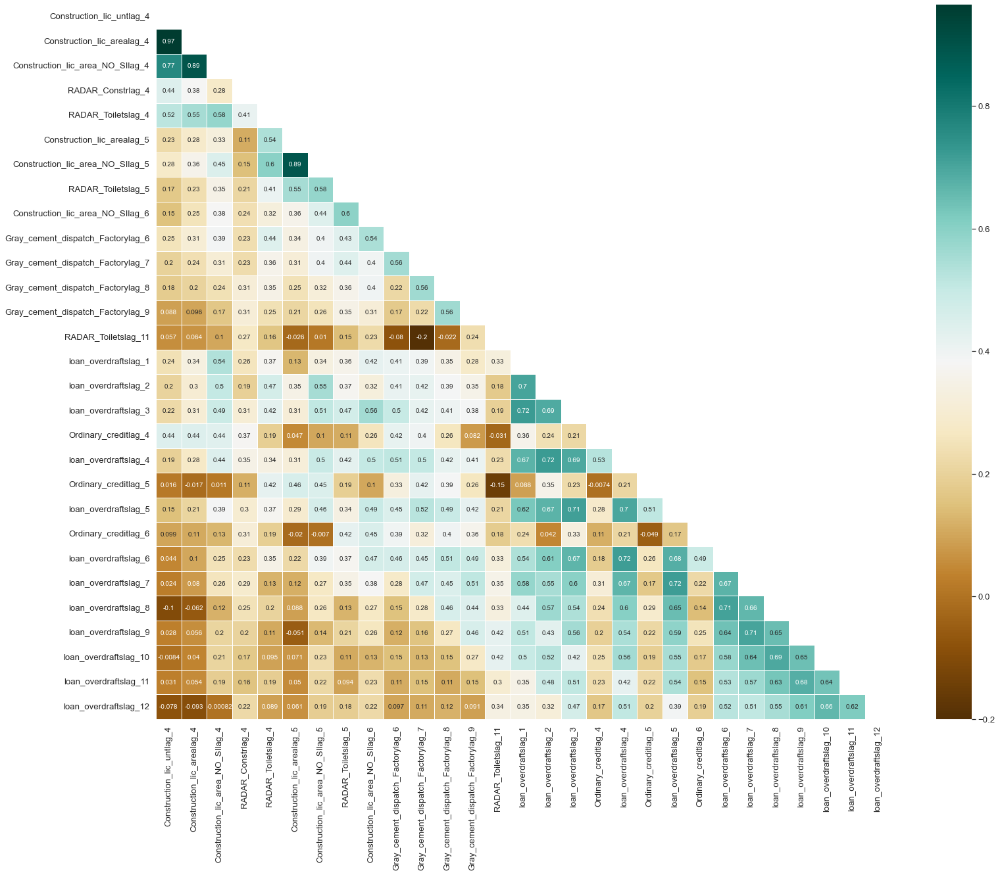

In [33]:
#Creating a data visualization of this new lower correlation dataset (not necessary to run)
plt.figure(figsize=(25,20))
mask1 = np.triu(np.ones_like(final_var_lower.corr(), dtype=np.bool))
heatmap = sns.heatmap(data = final_var_lower.corr(), annot= True, linewidths=.5, cmap='BrBG', mask=mask1,  annot_kws={"fontsize":10})

In [34]:
#Renaming the upper dataframe as well as showing the correlations without the heatmap 
upper_corr = final_var_upper.corr()
#upper_corr

#Renaming the lower dataframe as well as showing the correlations without the heatmap 
lower_corr = final_var_lower.corr()
#lower_corr

In [35]:
#Creating a new dataset with only the most highly correlated variables, this will be the dataset that will be merging
#the upper high correlations and the lower high correlations
correlated_features = set()

for i in range(len(upper_corr.columns)):
    for j in range(i):
        if abs(upper_corr.iloc[i, j]) > 0.70:
            colname = upper_corr.columns[i]
            correlated_features.add(colname)
#len(correlated_features)

In [36]:
#Adding the lower correlation variables to the correlated_feautures dataset
for i in range(len(lower_corr.columns)):
    for j in range(i):
        if abs(lower_corr.iloc[i, j]) > 0.75:
            colname = lower_corr.columns[i]
            correlated_features.add(colname)
#len(correlated_features)

In [37]:
#Bringing the two final_var datasets together
for i in range(len(final_var_lower.columns.to_list())):
        final_var_upper.append(final_var_lower)
#final_var_upper.columns

In [38]:
#Merging the two datasets together into one final dataset called result
result = final_var_lower.merge(final_var_upper, left_index=True, right_on='date')
len(result.axes[1])

52

In [39]:
#Now we are dropping the rest of the data that is comparatively not as highly correlated (whatever is in correlated_features)
result.drop(labels = correlated_features, axis = 1, inplace = True)
len(result.axes[1])

33

#### Merging selected correlated juan variables with our own variables

In [40]:
#Merging our variables with the variables we just decided were the best ones to use from above
FINAL42 = total_chosen.merge(result, left_index=True, right_on='date')
len(FINAL42.axes[1])

42

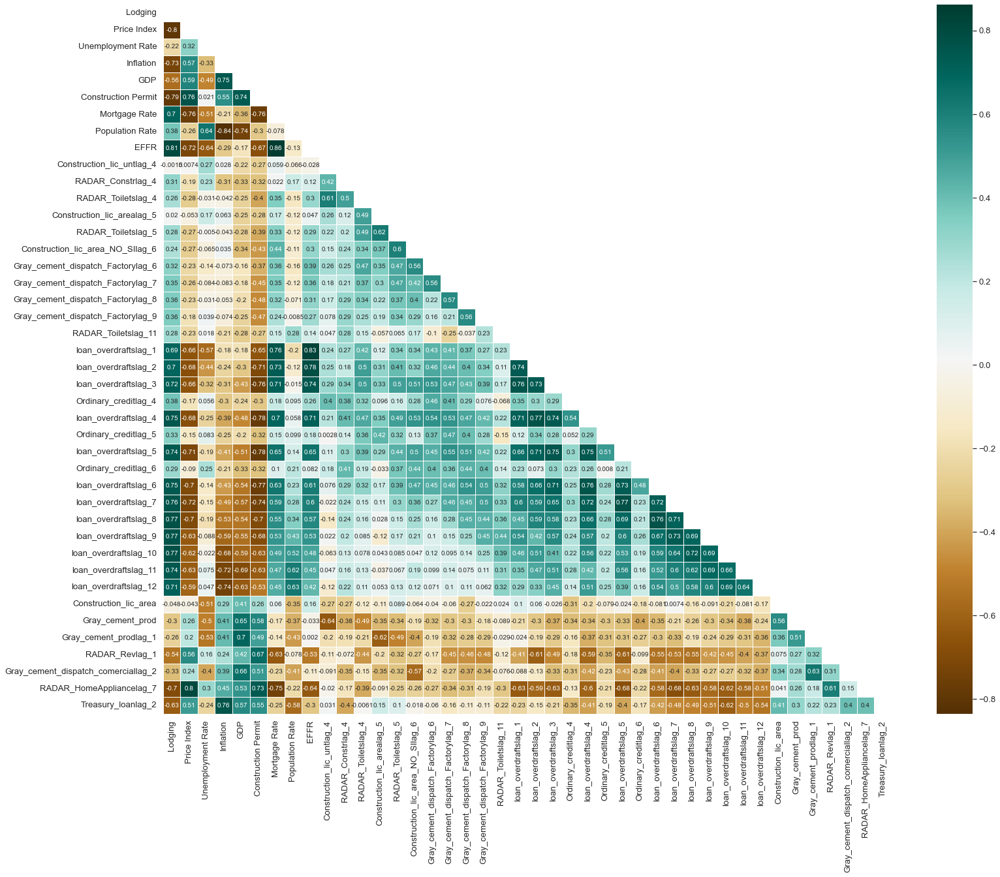

In [41]:
#Heatmap for data visualization (not necessary to run)
plt.figure(figsize=(25,20))
mask1 = np.triu(np.ones_like(FINAL42.corr(), dtype=np.bool))
heatmap = sns.heatmap(data = FINAL42.corr(), annot= True, linewidths=.5, cmap='BrBG', mask=mask1,  annot_kws={"fontsize":10})

# Running Multiple Regression without transforming the Data

In [42]:
#Running the multiple regression with our Final 42 variables against sales
#Setting X and y to use to train and test the data
X = FINAL42
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so dropping y variables until even with X
y = y.iloc[9:]

In [43]:
#Splitting the data into training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)
print(X_train.shape)
print(X_test.shape)

(35, 42)
(16, 42)


In [44]:
#Training the multiple regression model
LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

#print('Intercept:',LinearReg.intercept_)
#print('Coefficients:', LinearReg.coef_)

In [45]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.9999999999999999
Mean Absolute Error: 1.0000693679925097e-08
Mean Squared Error: 1.8522390143495607e-16
Root Mean Squared Error: 1.3609698800302529e-08


In [46]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: -705.7818013917232
Mean Absolute Error: 18.526134296928866
Mean Squared Error: 574.8345099614683
Root Mean Squared Error: 23.975706662400345


##### Data is definitely overfit lol

# Normalizing the data and Understanding which is the best approach

### Min Max Normalization Approach

In [47]:
#Min Max normalization keeps the variable values between 0 and 1
#Applying this normalization to our dataset with 42 variables. 
FinalMinMax = (FINAL42-FINAL42.min())/(FINAL42.max()-FINAL42.min())
#FinalMinMax.head(15)

##### Running Multiple Regression with min max normalized data

In [48]:
#Setting X and y using our 42 variable dataset to understand min max normalization worth
FinalMinMax = FinalMinMax.dropna()
X = FinalMinMax
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so dropping y variables until even with X
y = y.iloc[9:]

In [49]:
#Training our 42 variable data that is normalized using min max
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)
print(X_train.shape)
print(X_test.shape)

(35, 42)
(16, 42)


In [50]:
#Training the multiple regression model with min max normalization
LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

#print('Intercept:',LinearReg.intercept_)
#print('Coefficients:', LinearReg.coef_)

In [51]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 1.0
Mean Absolute Error: 3.95516952522712e-15
Mean Squared Error: 1.8430549778174595e-29
Root Mean Squared Error: 4.293081617926055e-15


In [52]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: -0.48374649015476034
Mean Absolute Error: 0.854634639214179
Mean Squared Error: 1.2067496430945146
Root Mean Squared Error: 1.0985215715198835


###### It can be seen there is a large discrepancy in R2, probably because we are using 42 vairables and the data is being overfitted. 
###### The R2 on the testing data is significantly better after being normalized than it was beforehand (-700)

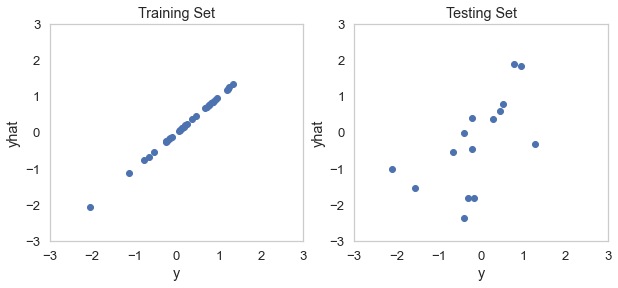

In [53]:
#Visualizing the training and testing models for the multiple regression

fig, ax = plt.subplots(ncols=2, figsize=(10,4))

ax[0].scatter(y_train, y_pred_Train)
ax[0].grid()
ax[0].set_xlabel('y')
ax[0].set_ylim(-3,3)
ax[0].set_xlim(-3,3)
ax[0].set_ylabel('yhat')
ax[0].set_title('Training Set')

ax[1].scatter(y_test, y_pred_Test)
ax[1].grid()
ax[1].set_ylim(-3,3)
ax[1].set_xlim(-3,3)
ax[1].set_xlabel('y')
ax[1].set_ylabel('yhat')
ax[1].set_title('Testing Set')
plt.show()

##### Running the tree model using min max normalized data

In [54]:
#Training the data to be used in TreeReg
#We are still using the dataset with the normalized 42 variables
TreeReg = DecisionTreeRegressor()
TreeReg.fit(X_train, y_train)

y_pred_Train = TreeReg.predict(X_train) #Predictions on training set
y_pred_Test = TreeReg.predict(X_test)   #Predictions on testing set

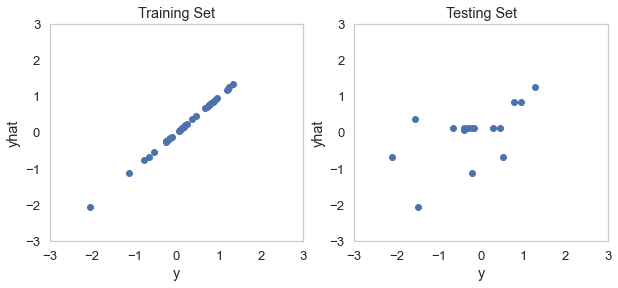

In [55]:
#Visualizing the data from treereg
fig, ax = plt.subplots(ncols=2, figsize=(10,4))

ax[0].scatter(y_train, y_pred_Train)
ax[0].grid()
ax[0].set_xlabel('y')
ax[0].set_ylim(-3,3)
ax[0].set_xlim(-3,3)
ax[0].set_ylabel('yhat')
ax[0].set_title('Training Set')

ax[1].scatter(y_test, y_pred_Test)
ax[1].grid()
ax[1].set_ylim(-3,3)
ax[1].set_xlim(-3,3)
ax[1].set_xlabel('y')
ax[1].set_ylabel('yhat')
ax[1].set_title('Testing Set')
plt.show()

In [56]:
#Finding the training errors from TreeReg
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 1.0
Mean Absolute Error: 0.0
Mean Squared Error: 0.0
Root Mean Squared Error: 0.0


In [57]:
#Finding the testing errors from TreeReg
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.2377406683487986
Mean Absolute Error: 0.594883618990445
Mean Squared Error: 0.6199550816255721
Root Mean Squared Error: 0.7873722636882583


###### It can be seen there may have been some overfitting in this model. 

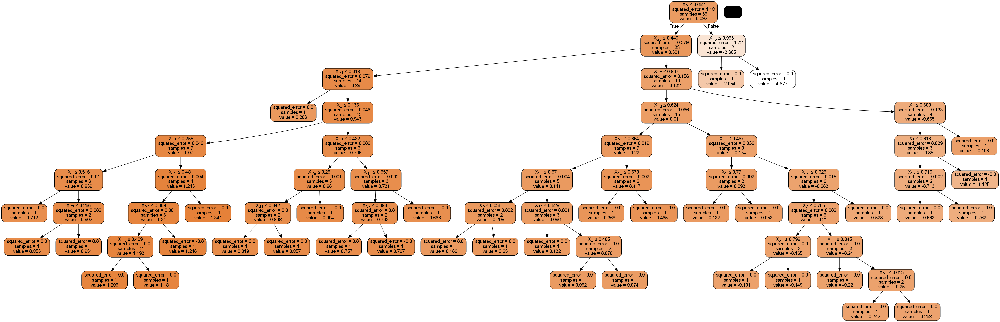

In [58]:
#Creating a tree graph of the data (not necessary to run)
dot_data = StringIO()

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"
#pip install graphviz in command prompt
#conda install graphviz in command prompt

export_graphviz(TreeReg, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

graph.write_png('WineTree.png')

Image(graph.create_png())

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 204.21it/s]


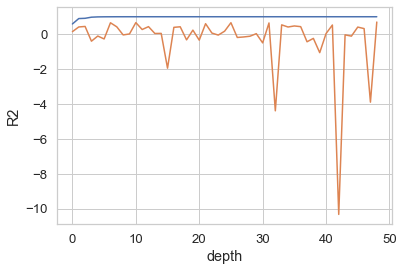

In [59]:
#Learning curves
train_R2 =[]
test_R2=[]

for depth in tqdm(range(1,50)):
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2) 
    dtree = DecisionTreeRegressor(max_depth=depth)
    dtree.fit(X_train,y_train)
    y_pred_Train = dtree.predict(X_train) #Predictions
    y_pred_Test = dtree.predict(X_test) #Predictions
    train_R2.append(metrics.r2_score(y_train,y_pred_Train))
    test_R2.append(metrics.r2_score(y_test, y_pred_Test))

plt.plot(train_R2)
plt.plot(test_R2)
plt.ylabel('R2')
plt.xlabel('depth')
plt.show()

In [60]:
Tree_Train_R2 = []
Tree_Test_R2 = []
for i in tqdm(range(1000)):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    TreeReg = DecisionTreeRegressor(max_depth = 10)
    TreeReg.fit(X_train, y_train)
    y_pred_Train  = TreeReg.predict(X_train)  #Predictions on testing model
    y_pred_Test  = TreeReg.predict(X_test)  #Predictions on testing model
    Tree_Train_R2.append(metrics.r2_score(y_train, y_pred_Train))
    Tree_Test_R2.append(metrics.r2_score(y_test, y_pred_Test))

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:05<00:00, 174.01it/s]


In [61]:
LR_Train_R2 = []
LR_Test_R2 = []
for i in tqdm(range(1000)):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    LinearReg = LinearRegression() #Creates the function
    LinearReg.fit(X_train, y_train) #Train the model
    y_pred_Train  = LinearReg.predict(X_train)  #Predictions on testing model
    y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model
    LR_Train_R2.append(metrics.r2_score(y_train, y_pred_Train))
    LR_Test_R2.append(metrics.r2_score(y_test, y_pred_Test))

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:05<00:00, 186.03it/s]


In [62]:
Train = pd.DataFrame(list(zip(Tree_Train_R2, LR_Train_R2)))
Test = pd.DataFrame(list(zip(Tree_Test_R2, LR_Test_R2)))

In [63]:
FINAL42.head()

,Lodging,Price Index,Unemployment Rate,Inflation,GDP,Construction Permit,Mortgage Rate,Population Rate,EFFR,Construction_lic_untlag_4,RADAR_Constrlag_4,RADAR_Toiletslag_4,Construction_lic_arealag_5,RADAR_Toiletslag_5,Construction_lic_area_NO_SIlag_6,Gray_cement_dispatch_Factorylag_6,Gray_cement_dispatch_Factorylag_7,Gray_cement_dispatch_Factorylag_8,Gray_cement_dispatch_Factorylag_9,RADAR_Toiletslag_11,loan_overdraftslag_1,loan_overdraftslag_2,loan_overdraftslag_3,Ordinary_creditlag_4,loan_overdraftslag_4,Ordinary_creditlag_5,loan_overdraftslag_5,Ordinary_creditlag_6,loan_overdraftslag_6,loan_overdraftslag_7,loan_overdraftslag_8,loan_overdraftslag_9,loan_overdraftslag_10,loan_overdraftslag_11,loan_overdraftslag_12,Construction_lic_area,Gray_cement_prod,Gray_cement_prodlag_1,RADAR_Revlag_1,Gray_cement_dispatch_comerciallag_2,RADAR_HomeAppliancelag_7,Treasury_loanlag_2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-10-01,28600,251.7,4.2,2.0,18310.300,1350.0,3.8950,0.0060,1.155714,14664.0,9.710251e+10,1.198796e+11,1449398.0,1.176807e+11,913987.0,205596.3325,241130.4555,228359.8390,194276.0200,1.100043e+11,6516924.507,7413831.896,6646777.625,6114471.231,7049950.723,6889420.854,8822385.041,5385395.732,6684153.427,8189116.436,6331676.215,5515276.146,5642495.572,7991063.784,6296655.582,1497239.0,1081553.104,1025617.127,1.028543e+11,540050.7470,9.035507e+10,420750.4705
2017-11-01,28483,251.7,4.2,2.2,18310.300,1290.0,3.9220,0.0059,1.155714,16087.0,1.800736e+11,1.531490e+11,1431181.0,1.198796e+11,1195060.0,227246.8955,205596.3325,241130.4555,228359.8390,1.548505e+11,5890846.208,6516924.507,7413831.896,5209669.987,6646777.625,6114471.231,7049950.723,6889420.854,8822385.041,6684153.427,8189116.436,6331676.215,5515276.146,5642495.572,7991063.784,1467734.0,1028965.694,1081553.104,1.094641e+11,534357.1910,1.099748e+11,373065.1072
2017-12-01,29615,251.7,4.1,2.1,18310.300,1304.0,3.9500,0.0058,1.298500,18444.0,1.346879e+11,1.367299e+11,1391495.0,1.531490e+11,1119734.0,218280.5785,227246.8955,205596.3325,241130.4555,1.727682e+11,7701153.283,5890846.208,6516924.507,6679817.029,7413831.896,5209669.987,6646777.625,6114471.231,7049950.723,8822385.041,6684153.427,8189116.436,6331676.215,5515276.146,5642495.572,1599591.0,1020361.518,1028965.694,1.173340e+11,542529.4955,8.701007e+10,298142.9317
2018-01-01,29737,253.3,4.0,2.1,18437.127,1314.0,4.0325,0.0057,1.416190,16604.0,1.043847e+11,1.303512e+11,1701480.0,1.367299e+11,849548.0,218583.6145,218280.5785,227246.8955,205596.3325,1.096908e+11,5680822.807,7701153.283,5890846.208,6322493.426,6516924.507,6679817.029,7413831.896,5209669.987,6646777.625,7049950.723,8822385.041,6684153.427,8189116.436,6331676.215,5515276.146,1281013.0,907424.551,1020361.518,8.814592e+10,543652.2385,9.780508e+10,480369.4465
2018-02-01,30454,261.2,4.1,2.2,18437.127,1342.0,4.3300,0.0056,1.416316,15722.0,9.317467e+10,1.229635e+11,1629518.0,1.303512e+11,1296992.0,220385.7770,218583.6145,218280.5785,227246.8955,1.191497e+11,7064674.723,5680822.807,7701153.283,5385524.479,5890846.208,6322493.426,6516924.507,6679817.029,7413831.896,6646777.625,7049950.723,8822385.041,6684153.427,8189116.436,6331676.215,1386019.0,955712.294,907424.551,1.508806e+11,520995.9945,1.214775e+11,520993.5086


### Standardization Approach

In [64]:
#another way to standardize the data, puts the points between -3 and 3. 
FinalStd = (FINAL42-FINAL42.mean())/FINAL42.std()
#FinalStd.head(5)
#certain instances may have better fits for preference, but these methods all achieve the same purpose. 

#### Running Multiple Regression with Standardization Approach

In [65]:
#Setting X and y using our new dataset to understand min max normalization worth
X = FinalStd
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so dropping y variables until even with X
y = y.iloc[9:]

In [66]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)
print(X_train.shape)
print(X_test.shape)

(35, 42)
(16, 42)


In [67]:
#Training the multiple regression model with min max normalization
LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

#print('Intercept:',LinearReg.intercept_)
#print('Coefficients:', LinearReg.coef_)

In [68]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 1.0
Mean Absolute Error: 1.8425737126546795e-15
Mean Squared Error: 4.273225847321479e-30
Root Mean Squared Error: 2.067178233080418e-15


In [69]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: -0.633996227565113
Mean Absolute Error: 0.9013832632510761
Mean Squared Error: 1.3289496403299426
Root Mean Squared Error: 1.1528007808506822


##### It can be seen the R2 from standardization is slightly worse than that of min max normalization

# Making our Dataset Thinner (in variable count)

###### Dropping similar variables manually (such as lagged variables showing up twice at different lags)

In [70]:
#Note we are dropping from FinalMinMax so we do not need to conitnually normalize the data. 
Final23 = FinalMinMax.drop(['loan_overdraftslag_2','loan_overdraftslag_3', 'loan_overdraftslag_4', 'loan_overdraftslag_5', 'loan_overdraftslag_6', 'loan_overdraftslag_7', 'loan_overdraftslag_8', 'Gray_cement_prodlag_1', 'RADAR_Toiletslag_5', 'RADAR_Toiletslag_11', 'Gray_cement_dispatch_Factorylag_7', 'Gray_cement_dispatch_Factorylag_8', 'Gray_cement_dispatch_Factorylag_9', 'loan_overdraftslag_9', 'loan_overdraftslag_10', 'loan_overdraftslag_11', 'loan_overdraftslag_12', 'Ordinary_creditlag_5', 'Ordinary_creditlag_6'], axis=1)
len(Final23.columns)

23

### Running an elastic net to determine which other variables should be dropped

In [71]:
#Setting X and y for next cell use
X = Final23
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so dropping y variables until even with X
y = y.iloc[9:]

In [72]:
#Running Eslastic Net to drop more variables in order to get our final 9 variables
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

ElasticNetReg = ElasticNet(alpha = 0.01, l1_ratio=1)  #Default value for alpha = 1
ElasticNetReg.fit(X_train, y_train)

y_pred_Train = ElasticNetReg.predict(X_train) #Predictions on training model
y_pred_Test  = ElasticNetReg.predict(X_test)  #Predictions on testing model

ElasRegInt = abs(ElasticNetReg.coef_)

#print('Intercept:',ElasticNetReg.intercept_)
#print('Coefficients:', ElasticNetReg.coef_)

In [73]:
#Creating a new dataframe which contains the variables kept from the elastic net
select_var = []

for i in range(len(Final23.columns.to_list())):
        if ElasRegInt[i] > 0:
            select_var.append(Final23.columns.to_list()[i])
print(len(select_var))

9


###### We can see we are left with 9 variables now. Let's take a look at them below

In [74]:
#Rennaming the new dataframe (these variables are already standardized through min max)
Final9 = Final23[select_var]
Final9.head()

,Unemployment Rate,Construction Permit,Population Rate,RADAR_Toiletslag_4,Construction_lic_area_NO_SIlag_6,loan_overdraftslag_1,Ordinary_creditlag_4,Gray_cement_prod,RADAR_Revlag_1
date,,,,,,,,,
2017-10-01,0.062500,0.327586,0.509804,0.452661,0.428331,0.691661,0.408816,0.825988,0.170780
2017-11-01,0.062500,0.253695,0.500000,0.803816,0.593870,0.573374,0.223771,0.776775,0.214230
2017-12-01,0.053571,0.270936,0.490196,0.630515,0.549507,0.915401,0.524437,0.768723,0.265962
2018-01-01,0.044643,0.283251,0.480392,0.563188,0.390380,0.533694,0.451359,0.663034,0.074095
2018-02-01,0.053571,0.317734,0.470588,0.485212,0.653903,0.795149,0.259736,0.708223,0.486479


## Running Some Analysis With Our 9 Variables

##### Start by Creating a df with our 9 variables, but using their original non-normalized values

In [75]:
#Creating our Final9 dataset without the normalization
#df2=df.loc[:, df.columns.drop(['Courses', 'Discount'])]
NotNormFinal9 = FINAL42.loc[:, ['Unemployment Rate','Construction Permit', 'Population Rate', 'RADAR_Toiletslag_4', 'Construction_lic_area_NO_SIlag_6', 'loan_overdraftslag_1', 'Ordinary_creditlag_4', 'Gray_cement_prod', 'RADAR_Revlag_1']].copy()
#NotNormFinal9.head()

## Running multiple regressions with the 9 feature dataset

#### Start with using the non-normalized data

In [76]:
#Setting X and y using NotNormFinal9
X = NotNormFinal9
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [77]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

In [78]:
#Training the multiple regression model 

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: 0.3879764266114174
Coefficients: [-1.88132088e-01  6.89738351e-04 -3.36794886e+01 -8.41516087e-12
 -6.95347711e-07 -1.46115566e-07 -2.23792557e-08  1.74695876e-06
  4.66455702e-12]


In [79]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.9119679344214099
Mean Absolute Error: 0.26396638141730877
Mean Squared Error: 0.10387173952201419
Root Mean Squared Error: 0.3222913891527575


In [80]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.5835184768927573
Mean Absolute Error: 0.38776193445668294
Mean Squared Error: 0.33872965004466704
Root Mean Squared Error: 0.5820048539700223


In [81]:
#Using Plotly to see the coefficients of each variable
model = LinearRegression()
model.fit(X_train, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

#### Now we'll run a multiple regression with the data normalized

In [82]:
#Setting X and y using Final9 (Min Max Normalization)
X = Final9
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [83]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

In [84]:
#Training the multiple regression model 

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: -0.12995336176526634
Coefficients: [-2.10671619  0.55977921 -0.3439475  -0.7984657  -1.18063402 -0.7734057
 -0.1094248   1.86674349  0.70963596]


In [85]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.9119679818354227
Mean Absolute Error: 0.26399392405820415
Mean Squared Error: 0.10387168357676334
Root Mean Squared Error: 0.3222913023597803


In [86]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.5836018536488239
Mean Absolute Error: 0.3877313656519076
Mean Squared Error: 0.33866183868248806
Root Mean Squared Error: 0.5819465943559495


In [87]:
#Using Plotly to see the coefficients of each variable
model = LinearRegression()
model.fit(X_train, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

##### The normalized data makes it more clear which variables hold a higher weight for our regression
##### Looking at the graph, we have decided to drop Population Rate and Ordinary Credit Lag 4

In [88]:
#Dropping the 2 less correlated variables, creating new df called TrialFinal7
## Important to note TrialFinal7 is not normalized data.
TrialFinal7 = NotNormFinal9.loc[:, ['Unemployment Rate', 'RADAR_Toiletslag_4', 'Construction_lic_area_NO_SIlag_6', 'loan_overdraftslag_1', 'Construction Permit', 'Gray_cement_prod', 'RADAR_Revlag_1']].copy()

## Running Multiple Regressions with our 7 Variables

In [89]:
#Running Multiple Regression on our 7 variables without normalization
#Setting X and y using Final9
X = TrialFinal7
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [90]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

#X_train_norm = (X_train-X_train.min())/(X_train.max()-X_train.min())
#X_test_norm = (X_test-X_test.min())/(X_test.max()-X_test.min())


#X_train_norm = (X_train-X_train.mean())/X_train.std()
#X_test_norm = (X_test-X_test.mean())/X_test.std()

#X_train_st = (X_train - mean)/stdev 
#X_test_st = (X_test - mean)/stdev

In [91]:
#Training the multiple regression model 

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: -0.06173448749220209
Coefficients: [-2.17603485e-01 -6.99237893e-12 -6.46368943e-07 -1.72115919e-07
  8.24141897e-04  1.72593260e-06  4.94000052e-12]


In [92]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.9089619555008727
Mean Absolute Error: 0.26977514635826544
Mean Squared Error: 0.10741858642820151
Root Mean Squared Error: 0.3277477481664848


In [93]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.5718858202562236
Mean Absolute Error: 0.40249278067831223
Mean Squared Error: 0.348190635689805
Root Mean Squared Error: 0.5900768049074672


In [94]:
#Looking at the coefficients using plotly
model = LinearRegression()
model.fit(X_train, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

##### Using Min Max Normalization with our Final7 Variables to run multiple regression

In [95]:
#Running Multiple Regression on our 7 variables without normalization
#Setting X and y using Final9
X = TrialFinal7
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [96]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

#Normalizing the training and testing data separately (min max)
X_train = (X_train-X_train.min())/(X_train.max()-X_train.min())
X_test = (X_test-X_test.min())/(X_test.max()-X_test.min())

In [97]:
#Training the multiple regression model with separately normalized final7 data

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: -0.3575097758828746
Coefficients: [-2.43715903 -0.6624777  -0.71108534 -0.91098733  0.66920322  1.84428413
  0.75150789]


In [98]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.9089619555008728
Mean Absolute Error: 0.2697751463582976
Mean Squared Error: 0.10741858642820144
Root Mean Squared Error: 0.32774774816648466


In [99]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.5050208787625408
Mean Absolute Error: 0.5059461225900572
Mean Squared Error: 0.4025727318352329
Root Mean Squared Error: 0.6344861951494555


In [100]:
#Looking at the coefficients using plotly
model = LinearRegression()
model.fit(X_train, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

##### Using Standardization with our Final7 Variables to run multiple regression

In [101]:
#Running Multiple Regression on our 7 variables without normalization
#Setting X and y using Final9
X = TrialFinal7
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [102]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

#Normalizing the training and testing data separately (standardization)
X_train = (X_train-X_train.mean())/X_train.std()
X_test = (X_test-X_test.mean())/X_test.std()

In [103]:
#Training the multiple regression model with separately normalized final7 data

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: 0.0919589964154523
Coefficients: [-0.55682115 -0.15229111 -0.1509977  -0.2353349   0.17166622  0.31786571
  0.16748276]


In [104]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.9089619555008727
Mean Absolute Error: 0.2697751463582976
Mean Squared Error: 0.1074185864282015
Root Mean Squared Error: 0.3277477481664847


In [105]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.580879530610098
Mean Absolute Error: 0.4566854411530651
Mean Squared Error: 0.34087593817803447
Root Mean Squared Error: 0.5838458171281476


In [106]:
#Looking at the coefficients using plotly
model = LinearRegression()
model.fit(X_train, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

##### It can be seen that through Min Max, our coefficients were better but the R2 was worse
##### It can be seen that through Standardization our coeffiicients were worse but the R2 was better

##### It can be seen the R2 is much better now at 58%. We may want to look at other possible ways of either data normalization, model types, or even explore different variables

##### Running the Tree Model now with our 9 variables

In [107]:
#Training the data to be used in TreeReg
#Now using normalized 9 variables
TreeReg = DecisionTreeRegressor()
TreeReg.fit(X_train, y_train)

y_pred_Train = TreeReg.predict(X_train) #Predictions on training set
y_pred_Test = TreeReg.predict(X_test)   #Predictions on testing set

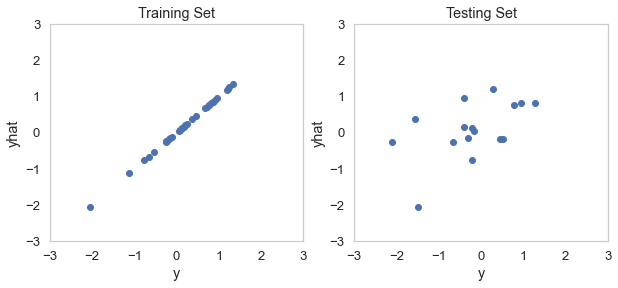

In [108]:
#Visualizing the data from treereg
fig, ax = plt.subplots(ncols=2, figsize=(10,4))

ax[0].scatter(y_train, y_pred_Train)
ax[0].grid()
ax[0].set_xlabel('y')
ax[0].set_ylim(-3,3)
ax[0].set_xlim(-3,3)
ax[0].set_ylabel('yhat')
ax[0].set_title('Training Set')

ax[1].scatter(y_test, y_pred_Test)
ax[1].grid()
ax[1].set_ylim(-3,3)
ax[1].set_xlim(-3,3)
ax[1].set_xlabel('y')
ax[1].set_ylabel('yhat')
ax[1].set_title('Testing Set')
plt.show()

In [109]:
#Finding the training errors from TreeReg
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 1.0
Mean Absolute Error: 0.0
Mean Squared Error: 0.0
Root Mean Squared Error: 0.0


In [110]:
#Finding the testing errors from TreeReg
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.07161890491569789
Mean Absolute Error: 0.6702143382817127
Mean Squared Error: 0.7550639968366983
Root Mean Squared Error: 0.8689441851101245


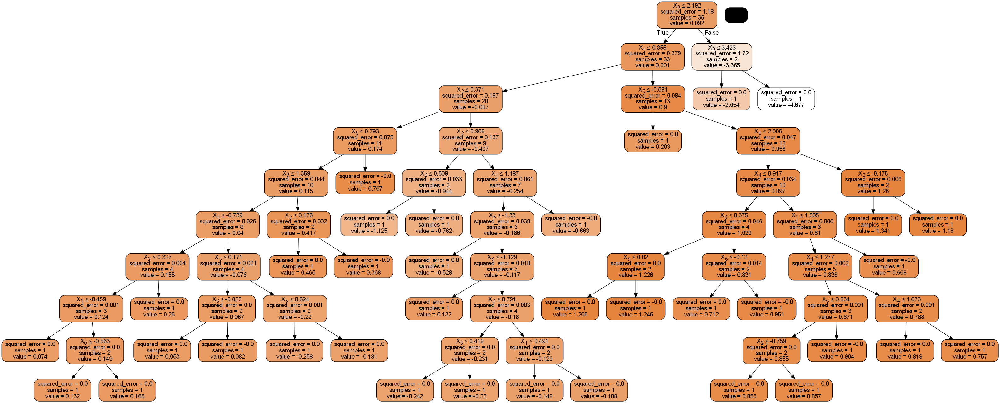

In [111]:
#Creating a tree graph of the data (not necessary to run)
dot_data = StringIO()

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"
#pip install graphviz in command prompt
#conda install graphviz in command prompt

export_graphviz(TreeReg, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

graph.write_png('WineTree.png')

Image(graph.create_png())

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 282.75it/s]


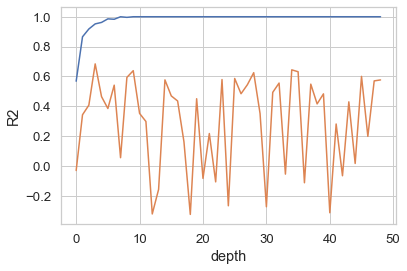

In [112]:
#Learning curves
train_R2 =[]
test_R2=[]

for depth in tqdm(range(1,50)):
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2) 
    dtree = DecisionTreeRegressor(max_depth=depth)
    dtree.fit(X_train,y_train)
    y_pred_Train = dtree.predict(X_train) #Predictions
    y_pred_Test = dtree.predict(X_test) #Predictions
    train_R2.append(metrics.r2_score(y_train,y_pred_Train))
    test_R2.append(metrics.r2_score(y_test, y_pred_Test))

plt.plot(train_R2)
plt.plot(test_R2)
plt.ylabel('R2')
plt.xlabel('depth')
plt.show()

In [113]:
Tree_Train_R2 = []
Tree_Test_R2 = []
for i in tqdm(range(1000)):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    TreeReg = DecisionTreeRegressor(max_depth = 10)
    TreeReg.fit(X_train, y_train)
    y_pred_Train  = TreeReg.predict(X_train)  #Predictions on testing model
    y_pred_Test  = TreeReg.predict(X_test)  #Predictions on testing model
    Tree_Train_R2.append(metrics.r2_score(y_train, y_pred_Train))
    Tree_Test_R2.append(metrics.r2_score(y_test, y_pred_Test))

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 274.87it/s]


In [114]:
LR_Train_R2 = []
LR_Test_R2 = []
for i in tqdm(range(1000)):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    LinearReg = LinearRegression() #Creates the function
    LinearReg.fit(X_train, y_train) #Train the model
    y_pred_Train  = LinearReg.predict(X_train)  #Predictions on testing model
    y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model
    LR_Train_R2.append(metrics.r2_score(y_train, y_pred_Train))
    LR_Test_R2.append(metrics.r2_score(y_test, y_pred_Test))

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 208.60it/s]


In [115]:
Train = pd.DataFrame(list(zip(Tree_Train_R2, LR_Train_R2)))
Test = pd.DataFrame(list(zip(Tree_Test_R2, LR_Test_R2)))

###### Tree model still shows a poor R2, telling us this is not a trusted model. 

### Using a gradient boost on our Final 7 variables

In [117]:
#Setting X and y using Final7
X = TrialFinal7
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [118]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.20, random_state=0)

In [119]:
mean = X_train.mean()
print(mean)

Unemployment Rate                   5.180000e+00
RADAR_Toiletslag_4                  1.243276e+11
Construction_lic_area_NO_SIlag_6    9.174940e+05
loan_overdraftslag_1                5.450901e+06
Construction Permit                 1.488075e+03
Gray_cement_prod                    1.062627e+06
RADAR_Revlag_1                      1.250930e+11
dtype: float64


In [120]:
stdev = X_train.std()
print(stdev)

Unemployment Rate                   2.431123e+00
RADAR_Toiletslag_4                  2.124143e+10
Construction_lic_area_NO_SIlag_6    2.500055e+05
loan_overdraftslag_1                1.330408e+06
Construction Permit                 2.039286e+02
Gray_cement_prod                    1.737209e+05
RADAR_Revlag_1                      3.413729e+10
dtype: float64


<AxesSubplot:>

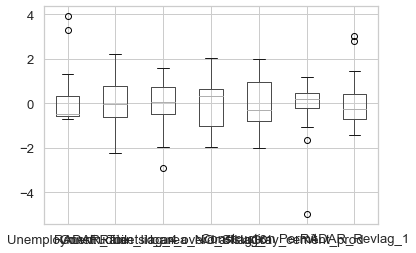

In [121]:
X_train_st = (X_train - mean)/stdev 
X_train_st.boxplot()

<AxesSubplot:>

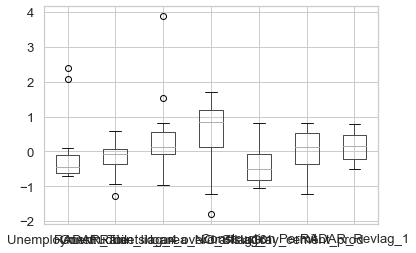

In [122]:
X_test_st = (X_test - mean)/stdev 
X_test_st.boxplot()

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 42.37it/s]


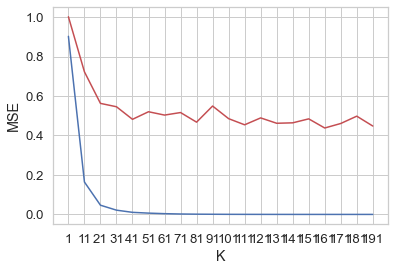

In [123]:
train_mse = []
pred_mse = []
K = list(range(1,200,10))

for k in tqdm(K):
    
    model = GradientBoostingRegressor(n_estimators=k) #Number of trees in the forest
    model.fit(X_train_st, y_train.ravel()) #ravel flattens the array

    y_pred_Train = model.predict(X_train_st) #Predictions
    y_pred_Test = model.predict(X_test_st) #Predictions
        
    train_mse.append(metrics.mean_squared_error(y_train, y_pred_Train))
    pred_mse.append(metrics.mean_squared_error(y_test, y_pred_Test))
       
plt.plot(K,train_mse,'b')
plt.plot(K,pred_mse,'r')
plt.xlabel('K')
plt.ylabel('MSE')
plt.xticks(K)
plt.show()

Test Metrics:
R squared: 0.5793989153394419
Mean Absolute Error: 0.6525285332934693
Mean Squared Error: 1.1162531556131425
Root Mean Squared Error: 1.0565288238439794


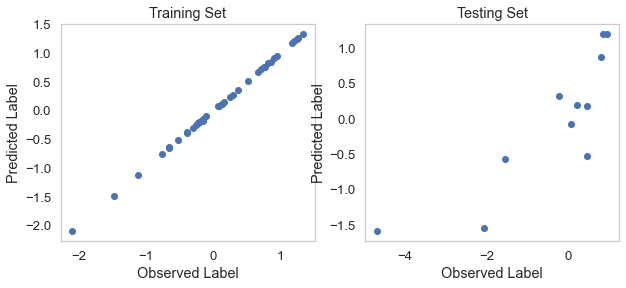

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:02<00:00, 37.29it/s]


Train MSE median: 0.0001772701885588698
Test MSE median: 0.3297534872604405

Train_R2 median: 0.9998377982793759
Test_R2 median: 0.5771111077991293


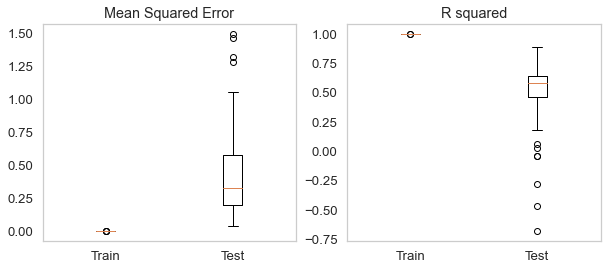

Train MSE standard deviation: 9.7248101679433e-05
Test MSE standard deviation:  0.3365689073105463

Train_R2 standard deviation: 8.869103681656871e-05
Test_R2 standard deviation:  0.24968173248309244


In [124]:
model = GradientBoostingRegressor(n_estimators=100)
Model_Performance(model,X,y)

In [125]:
#Looking at the coefficients using plotly
model = LinearRegression()
model.fit(X_train_st, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

In [126]:
#Dropping Construction_lic_area_NO_SIlag_6 
#This data is still originally valued
FirstFinal6 = NotNormFinal9.loc[:, ['Unemployment Rate', 'RADAR_Toiletslag_4', 'loan_overdraftslag_1', 'Construction Permit', 'Gray_cement_prod', 'RADAR_Revlag_1']].copy()

In [127]:
FirstFinal6.head()

,Unemployment Rate,RADAR_Toiletslag_4,loan_overdraftslag_1,Construction Permit,Gray_cement_prod,RADAR_Revlag_1
date,,,,,,
2017-10-01,4.2,1.198796e+11,6516924.507,1350.0,1081553.104,1.028543e+11
2017-11-01,4.2,1.531490e+11,5890846.208,1290.0,1028965.694,1.094641e+11
2017-12-01,4.1,1.367299e+11,7701153.283,1304.0,1020361.518,1.173340e+11
2018-01-01,4.0,1.303512e+11,5680822.807,1314.0,907424.551,8.814592e+10
2018-02-01,4.1,1.229635e+11,7064674.723,1342.0,955712.294,1.508806e+11


##### Running MR on FirstFinal6 using their original values

In [128]:
#Setting X and y using FirstFinal6
X = FirstFinal6
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [129]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

In [130]:
#Training the multiple regression model with separately normalized firstfinal6 data

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: -0.8135674965151327
Coefficients: [-1.98601701e-01 -9.24104206e-12 -1.77435739e-07  1.14888958e-03
  1.68595682e-06  4.37681106e-12]


In [131]:
FirstFinal6.head()

,Unemployment Rate,RADAR_Toiletslag_4,loan_overdraftslag_1,Construction Permit,Gray_cement_prod,RADAR_Revlag_1
date,,,,,,
2017-10-01,4.2,1.198796e+11,6516924.507,1350.0,1081553.104,1.028543e+11
2017-11-01,4.2,1.531490e+11,5890846.208,1290.0,1028965.694,1.094641e+11
2017-12-01,4.1,1.367299e+11,7701153.283,1304.0,1020361.518,1.173340e+11
2018-01-01,4.0,1.303512e+11,5680822.807,1314.0,907424.551,8.814592e+10
2018-02-01,4.1,1.229635e+11,7064674.723,1342.0,955712.294,1.508806e+11


In [132]:
LinearReg.predict([[4.2, 1.198796e+11, 6516924.507, 1350.0, 1081553.104, 1.028543e+11]])

array([-0.08721577])

In [133]:
sales.Quantity.head(10)

date
2017-01-01    1.115820
2017-02-01    1.098511
2017-03-01   -0.073592
2017-04-01   -0.962691
2017-05-01   -0.638951
2017-06-01   -0.198644
2017-07-01    0.599377
2017-08-01   -0.248960
2017-09-01   -0.706704
2017-10-01   -0.655682
Name: Quantity, dtype: float64

In [134]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.8978810690078363
Mean Absolute Error: 0.2965701131622405
Mean Squared Error: 0.12049326493213984
Root Mean Squared Error: 0.347121397975031


In [135]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.624076101924584
Mean Absolute Error: 0.37053521886091045
Mean Squared Error: 0.30574362456344556
Root Mean Squared Error: 0.5529408870425894


In [136]:
#Looking at the coefficients using plotly
model = LinearRegression()
model.fit(X_train, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

##### Running MR with FirstFinal6 while normalizing based with respective training and testing minmax's

In [137]:
First6MinMax = (FirstFinal6-FirstFinal6.min())/(FirstFinal6.max()-FirstFinal6.min())
First6MinMax.head()

,Unemployment Rate,RADAR_Toiletslag_4,loan_overdraftslag_1,Construction Permit,Gray_cement_prod,RADAR_Revlag_1
date,,,,,,
2017-10-01,0.062500,0.452661,0.691661,0.327586,0.825988,0.170780
2017-11-01,0.062500,0.803816,0.573374,0.253695,0.776775,0.214230
2017-12-01,0.053571,0.630515,0.915401,0.270936,0.768723,0.265962
2018-01-01,0.044643,0.563188,0.533694,0.283251,0.663034,0.074095
2018-02-01,0.053571,0.485212,0.795149,0.317734,0.708223,0.486479


In [138]:
#Setting X and y using FirstFinal6
X = First6MinMax
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [139]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

In [140]:
#Training the multiple regression model with separately normalized firstfinal6 data

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: -0.8096980552513637
Coefficients: [-2.22433905 -0.87552239 -0.93914445  0.93289834  1.80156712  0.66583152]


In [141]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.8978810690078363
Mean Absolute Error: 0.2965701131620793
Mean Squared Error: 0.12049326493213978
Root Mean Squared Error: 0.3471213979750309


In [142]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.6240761019255847
Mean Absolute Error: 0.3705352188607587
Mean Squared Error: 0.3057436245626316
Root Mean Squared Error: 0.5529408870418533


In [143]:
#Looking at the coefficients using plotly
model = LinearRegression()
model.fit(X_train, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

In [ ]:
## It can be seen using the minmax values for FirstFinal6 holds a very similar R2, only difference being is the coefficients
## are less extreme, which makes sense.

### Using a different grouping of features and running the regressions again (Dropped Unemployment Rate, added Construction Lic area no siLag6

#### Running MR using original variable values

In [144]:
ScndFinal6 = NotNormFinal9.loc[:, ['Construction_lic_area_NO_SIlag_6', 'RADAR_Toiletslag_4', 'loan_overdraftslag_1', 'Construction Permit', 'Gray_cement_prod', 'RADAR_Revlag_1']].copy()

In [145]:
#Setting X and y using FirstFinal6
X = ScndFinal6
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [146]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

In [147]:
#Training the multiple regression model with separately normalized firstfinal6 data

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: -5.5289699485419685
Coefficients: [-3.62087796e-07 -7.00102678e-12  7.29925432e-08  1.34723754e-03
  3.79209353e-06  2.89951021e-12]


In [148]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.8531517602160845
Mean Absolute Error: 0.3378541309867247
Mean Squared Error: 0.17327075096839312
Root Mean Squared Error: 0.416258034118734


In [149]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.5596004298171913
Mean Absolute Error: 0.47100379106648205
Mean Squared Error: 0.35818249792904294
Root Mean Squared Error: 0.5984834984601021


In [150]:
#Looking at the coefficients using plotly
model = LinearRegression()
model.fit(X_train, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

#### Running MR using MinMax values (all minmaxed)

In [151]:
Scnd6MinMax = (ScndFinal6-ScndFinal6.min())/(ScndFinal6.max()-ScndFinal6.min())
Scnd6MinMax.head()

,Construction_lic_area_NO_SIlag_6,RADAR_Toiletslag_4,loan_overdraftslag_1,Construction Permit,Gray_cement_prod,RADAR_Revlag_1
date,,,,,,
2017-10-01,0.428331,0.452661,0.691661,0.327586,0.825988,0.170780
2017-11-01,0.593870,0.803816,0.573374,0.253695,0.776775,0.214230
2017-12-01,0.549507,0.630515,0.915401,0.270936,0.768723,0.265962
2018-01-01,0.390380,0.563188,0.533694,0.283251,0.663034,0.074095
2018-02-01,0.653903,0.485212,0.795149,0.317734,0.708223,0.486479


In [152]:
#Setting X and y using FirstFinal6
X = Scnd6MinMax
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [153]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

In [154]:
#Training the multiple regression model with separately normalized firstfinal6 data

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: -3.489492173801843
Coefficients: [-0.61479901 -0.66329703  0.3863401   1.09395688  4.05212692  0.44109404]


In [155]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.8531517602160846
Mean Absolute Error: 0.3378541309869083
Mean Squared Error: 0.17327075096839298
Root Mean Squared Error: 0.41625803411873386


In [156]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.5596004298170811
Mean Absolute Error: 0.47100379106640555
Mean Squared Error: 0.3581824979291324
Root Mean Squared Error: 0.5984834984601768


In [157]:
#Looking at the coefficients using plotly
model = LinearRegression()
model.fit(X_train, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

##### The R2 with these features is lower, so we will stick with the FirstFinal6 variables

## Back to FirstFinal6 variables

### Splitting the training and testing based on the training data using Standardization (But the same way as 05 ML algorithms)

In [158]:
#Setting X and y using FirstFinal6
X = FirstFinal6
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [159]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.20, random_state=0)

In [160]:
mean = X_train.mean()
print(mean)

Unemployment Rate       5.180000e+00
RADAR_Toiletslag_4      1.243276e+11
loan_overdraftslag_1    5.450901e+06
Construction Permit     1.488075e+03
Gray_cement_prod        1.062627e+06
RADAR_Revlag_1          1.250930e+11
dtype: float64


In [161]:
stdev = X_train.std()
print(stdev)

Unemployment Rate       2.431123e+00
RADAR_Toiletslag_4      2.124143e+10
loan_overdraftslag_1    1.330408e+06
Construction Permit     2.039286e+02
Gray_cement_prod        1.737209e+05
RADAR_Revlag_1          3.413729e+10
dtype: float64


<AxesSubplot:>

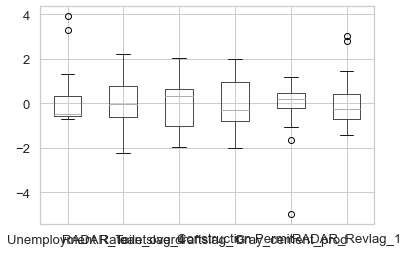

In [162]:
X_train_st = (X_train - mean)/stdev 
X_train_st.boxplot()

<AxesSubplot:>

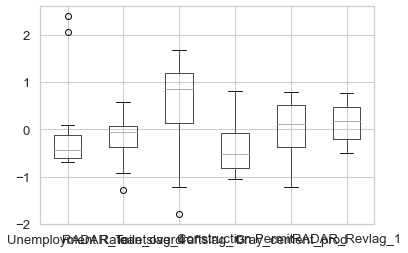

In [163]:
X_test_st = (X_test - mean)/stdev 
X_test_st.boxplot()

In [164]:
#Training the multiple regression model with separately normalized firstfinal6 data

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train_st, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train_st) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test_st)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: 0.09269250005320731
Coefficients: [-0.50227465 -0.23801705 -0.23081321  0.26600371  0.24797094  0.13096244]


In [165]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.8969084682015398
Mean Absolute Error: 0.2693032904901551
Mean Squared Error: 0.11267931315426982
Root Mean Squared Error: 0.3356773944641936


In [166]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.5333806988489327
Mean Absolute Error: 0.48423151233105605
Mean Squared Error: 0.42185716947650714
Root Mean Squared Error: 0.6495053267499098


In [167]:
#Looking at the coefficients using plotly
model = LinearRegression()
model.fit(X_train_st, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

### Splitting the training and testing based on the training data using Normalization (minmax)

In [168]:
#Setting X and y using FirstFinal6
X = FirstFinal6
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [169]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

In [170]:
min = X_train.min()
print(min)

Unemployment Rate       3.500000e+00
RADAR_Toiletslag_4      7.699317e+10
loan_overdraftslag_1    2.856051e+06
Construction Permit     1.084000e+03
Gray_cement_prod        1.989249e+05
RADAR_Revlag_1          7.687401e+10
dtype: float64


In [171]:
max = X_train.max()
print(max)

Unemployment Rate       1.470000e+01
RADAR_Toiletslag_4      1.717360e+11
loan_overdraftslag_1    8.148922e+06
Construction Permit     1.896000e+03
Gray_cement_prod        1.267497e+06
RADAR_Revlag_1          2.290011e+11
dtype: float64


In [172]:
minmax = max - min

<AxesSubplot:>

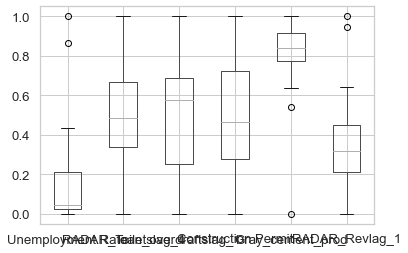

In [173]:
X_train_norm = (X_train - min)/minmax 
X_train_norm.boxplot()

<AxesSubplot:>

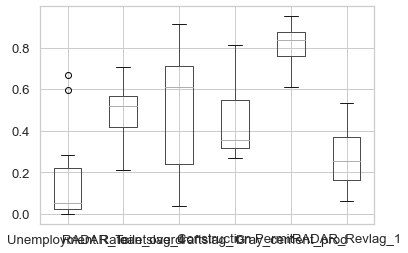

In [174]:
X_test_norm = (X_test - min)/minmax 
X_test_norm.boxplot()

In [175]:
#Training the multiple regression model with separately normalized firstfinal6 data

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train_norm, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train_norm) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test_norm)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: -0.8096980552513637
Coefficients: [-2.22433905 -0.87552239 -0.93914445  0.93289834  1.80156712  0.66583152]


In [176]:
LinearReg.predict([[0.062500, 0.452661, 0.691661, 0.327586, 0.825988, 0.170780]])

array([-0.08721571])

In [177]:
#Observing the errors for the training
print('R squared:', metrics.r2_score(y_train, y_pred_Train))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, y_pred_Train))  
print('Mean Squared Error:', metrics.mean_squared_error(y_train, y_pred_Train))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, y_pred_Train)))

R squared: 0.8978810690078363
Mean Absolute Error: 0.2965701131620793
Mean Squared Error: 0.12049326493213978
Root Mean Squared Error: 0.3471213979750309


In [178]:
#Observing the errors for the testing
print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

R squared: 0.6240761019255847
Mean Absolute Error: 0.3705352188607587
Mean Squared Error: 0.3057436245626316
Root Mean Squared Error: 0.5529408870418533


In [179]:
#Looking at the coefficients using plotly
model = LinearRegression()
model.fit(X_train_norm, y_train)

colors = ['Positive' if c > 0 else 'Negative' for c in model.coef_]

fig = px.bar(
    x=X.columns, y=model.coef_, color=colors,
    color_discrete_sequence=['red', 'blue'],
    labels=dict(x='Feature', y='Linear coefficient'),
    title='Weight of each feature for predicting Corona sales'
)
fig.show()

In [180]:
#Setting X and y using FirstFinal6
X = FirstFinal6
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [181]:
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

def format_coefs(coefs):
    equation_list = [f"{coef}x^{i}" for i, coef in enumerate(coefs)]
    equation = "$" +  " + ".join(equation_list) + "$"

    replace_map = {"x^0": "", "x^1": "x", '+ -': '- '}
    for old, new in replace_map.items():
        equation = equation.replace(old, new)

    return equation

df = y
XX = FirstFinal6.Gray_cement_prod.values.reshape(-1, 1)
x_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)

fig = px.scatter(df, x=X.index, y=y, opacity=0.65)
for degree in [1, 2, 3, 4, 5, 6]:
    poly = PolynomialFeatures(degree)
    poly.fit(XX)
    X_poly = poly.transform(XX)
    x_range_poly = poly.transform(x_range)

    model = LinearRegression(fit_intercept=False)
    model.fit(X_poly, df)
    y_poly = model.predict(x_range_poly)

    equation = format_coefs(model.coef_.round(2))
    fig.add_trace(go.Scatter(x=x_range.squeeze(), y=y_poly, name=equation))

fig.show()


#### The R2 and coefficients were better for the min max normalization, so we will be continuing with this data normalization

## Using KNN algorithm

In [182]:
#Setting X and y using FirstFinal6
X = FirstFinal6
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [183]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

In [184]:
min = X_train.min()
#print(min)

In [185]:
max = X_train.max()
#print(max)

In [186]:
minmax = max - min

In [187]:
X_train_norm = (X_train - min)/minmax 
#X_train_norm.boxplot()

In [188]:
X_test_norm = (X_test - min)/minmax 
#X_test_norm.boxplot()

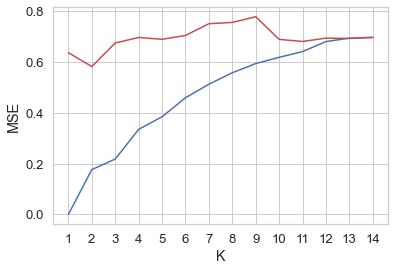

In [189]:
train_mse = []
test_mse = []
K = list(range(1,15))

for k in K:

    model = KNeighborsRegressor(n_neighbors=k)
    model.fit(X_train_norm,y_train)
    
    y_pred_Train = model.predict(X_train_norm) #Predictions
    y_pred_Test = model.predict(X_test_norm) #Predictions
        
    train_mse.append(metrics.mean_squared_error(y_train, y_pred_Train))
    test_mse.append(metrics.mean_squared_error(y_test, y_pred_Test))
       
plt.plot(K,train_mse,'b')
plt.plot(K,test_mse,'r')
plt.xlabel('K')
plt.ylabel('MSE')
plt.xticks(K)
plt.show()

Test Metrics:
R squared: 0.6368907181032455
Mean Absolute Error: 0.6159919015336736
Mean Squared Error: 0.8746914982932427
Root Mean Squared Error: 0.935249431057428


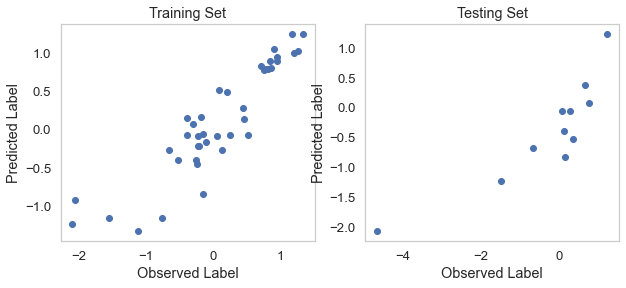

100%|███████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 136.75it/s]


Train MSE median: 0.14276999479918284
Test MSE median: 0.4465827017720307

Train_R2 median: 0.8690402831947615
Test_R2 median: 0.46164971679338884


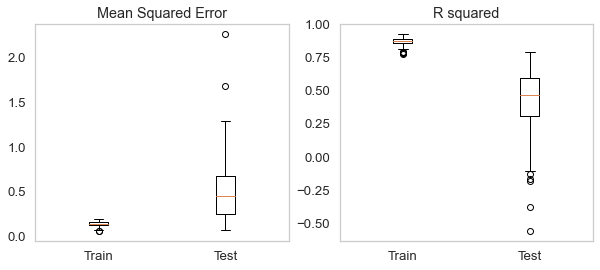

Train MSE standard deviation: 0.03013673757236545
Test MSE standard deviation:  0.38833865044332955

Train_R2 standard deviation: 0.02935037961132571
Test_R2 standard deviation:  0.25157365152078626


In [190]:
model = KNeighborsRegressor(n_neighbors=2)
Model_Performance(model,X,y)

## SVM (Support Vector Matrix) Regression Analysis

In [ ]:
#kernel{‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’}, default=’rbf’

SVReg = SVR(kernel = 'linear') 
SVReg.fit(X_train, y_train)

y_pred_Train = SVReg.predict(X_train) #Predictions
y_pred_Test = SVReg.predict(X_test) #Predictions

print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

plt.scatter(y_train, y_pred_Train)
plt.scatter(y_test, y_pred_Test)

In [ ]:
#About 1.5 minutes

from sklearn.model_selection import GridSearchCV
from time import time


start = time()

param_grid = {'C': [0.1, 1, 10],
              'kernel': ['rbf', 'linear', 'poly']}

grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)

# fitting the model for grid search
grid.fit(X_train_norm, y_train)

print('\nProcessing time:', time()-start)

In [ ]:
# print best parameter after tuning
print(grid.best_params_)
 
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

In [ ]:
y_pred_Train = grid.predict(X_train) #Predictions
y_pred_Test = grid.predict(X_test) #Predictions

print('R squared:', metrics.r2_score(y_test, y_pred_Test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_Test))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_Test))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_Test)))

plt.scatter(y_train, y_pred_Train)
plt.scatter(y_test, y_pred_Test)

## Sales Predictions Based on Feature Values

In [191]:
sales.head()

,Booking,Quantity,seasonal,trend_short_6,trend_short_12
date,,,,,
2017-01-01,0.780650,1.115820,0.609917,NaN,NaN
2017-02-01,0.140791,1.098511,1.462032,NaN,NaN
2017-03-01,-0.619820,-0.073592,-0.676013,NaN,NaN
2017-04-01,-1.229009,-0.962691,-2.031736,NaN,NaN
2017-05-01,-0.747583,-0.638951,-1.209845,NaN,NaN


In [192]:
df = px.data.tips()
X = df.total_bill.values.reshape(-1, 1)

model = LinearRegression()
model.fit(X, df.tip)

x_range = np.linspace(X.min(), X.max(), 100)
y_range = model.predict(x_range.reshape(-1, 1))

fig = px.scatter(df, x='total_bill', y='tip', opacity=0.65)
fig.add_traces(go.Scatter(x=x_range, y=y_range, name='Regression Fit'))
fig.show()

In [194]:
#Setting X and y using FirstFinal6
X = FirstFinal6
y = sales.Quantity 

#There were dropped X variables but the y is still behind in date, so using y variables even with X
y = y.iloc[9:]

In [195]:
#Splitting the data 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=5)

In [196]:
#Training the multiple regression model with separately normalized firstfinal6 data

LinearReg = LinearRegression() #Creates the function
LinearReg.fit(X_train, y_train) #Train the model

y_pred_Train = LinearReg.predict(X_train) #Predictions on training model
y_pred_Test  = LinearReg.predict(X_test)  #Predictions on testing model

print('Intercept:',LinearReg.intercept_)
print('Coefficients:', LinearReg.coef_)

Intercept: -0.8135674965151327
Coefficients: [-1.98601701e-01 -9.24104206e-12 -1.77435739e-07  1.14888958e-03
  1.68595682e-06  4.37681106e-12]
